### Functions & define

In [9]:
import numpy as np
from matplotlib import pyplot as plt

def load_session_data(subject, date):
    """Load all data for a given subject and date"""
    import sys
    sys.path.append(r'D:\Neural-Pipeline\source')
    from analysis_utils.NeuralDataLoader import NeuralDataLoader, Dots3DMPConfig
    
    # Load session
    loader = NeuralDataLoader()
    loader.load_session(subject, date)
    config = Dots3DMPConfig(subject)

    # spike data (unit, trial, time)
    stimOn_spikes = loader.get_spike_data(alignment='stimOn', good_units_only=True, good_trials_only=True)
    saccOnset_spikes = loader.get_spike_data(alignment='saccOnset', good_units_only=True, good_trials_only=True)
    postTargHold_spikes = loader.get_spike_data(alignment='postTargHold', good_units_only=True, good_trials_only=True)
    tuning_spikes = loader.get_tuning_data(good_units_only=True, good_trials_only=True)

    # behavioral data
    behavior_dots3DMP = loader.get_behavioral_data(task='dots3DMP', good_trials_only=True)
    behavior_tuning = loader.get_behavioral_data(task='tuning', good_trials_only=True)
    behavior_converted = config.convert_behavioral_data(behavior_dots3DMP, task='dots3DMP')
    behavior_tuning_converted = config.convert_behavioral_data(behavior_tuning, task='tuning')

    # Unit Info
    unit_info = loader.get_unit_info(good_units_only=True)
    MST_units = loader.get_units_by_area(unit_info, area_name='MST')
    VPS_units = loader.get_units_by_area(unit_info, area_name='VPS')
    dual_units = loader.get_units_by_area(unit_info, area_name='dual')

    # Time Info
    time_info = config.get_time_Info('dots3DMP')
    time_info_tuning = config.get_time_Info('tuning')
    time_axes_dots3DMP = config.get_time_axes('dots3DMP')

    # Prepare data
    spikes_data = {
        'stimOn': stimOn_spikes,
        'saccOnset': saccOnset_spikes,
        'postTargHold': postTargHold_spikes
    }
    
    units_data = {
        'MST': MST_units,
        'VPS': VPS_units,
        'dual': dual_units
    }
    
    return {
        'loader': loader,
        'config': config,
        'spikes_data': spikes_data,
        'behavior_converted': behavior_converted,
        'behavior_tuning_converted': behavior_tuning_converted,
        'unit_info': unit_info,
        'units_data': units_data,
        'time_axes_dots3DMP': time_axes_dots3DMP,
        'time_info': time_info,
        'time_info_tuning': time_info_tuning
    }

def calculate_decision_variable(y_test, y_proba, epsilon=1e-10):
    """
    Calculate decision variable from classifier probabilities
    Handles both single values and arrays
    """
    # Convert to arrays if single values
    if np.isscalar(y_test):
        y_test = np.array([y_test])
        y_proba = np.array([y_proba])
        single_value = True
    else:
        single_value = False
    
    dvs = []
    for idx, val in enumerate(y_proba):
        if val < 0 or val > 1:
            raise ValueError(f"y_proba contains invalid probability value at index {idx}: {val}. Must be in [0, 1].")
        y_test_ = int(y_test[idx])
        y_proba_ = float(y_proba[idx])
        # Ensure y_proba is in valid range [epsilon, 1-epsilon]
        y_proba_clipped = np.clip(y_proba_, epsilon, 1 - epsilon)
        
        # Calculate log-odds (decision variable)
        dv = np.log(y_proba_clipped / (1 - y_proba_clipped))
        
        # If true class is 0, flip the sign
        if y_test_ == 0:
            dv = -dv
        dvs.append(dv)
    
    if single_value:
        return dvs[0]  # Return single value
    else:
        return np.mean(dvs)  # Return mean for arrays

# Function to create file path based on modality/coherence condition
def get_filepath(date, area, alignment, target, mod, coh, regression='decoders'):
    subject = 'zarya'
    if target == 'stimulus':
        trial_condition = 'correct_non_zero'
    elif target == 'choice':    
        trial_condition = 'non_zero'
    elif target == 'PDW':
        trial_condition = 'small_heading_single_target'

    decoder_folder = f"D:\\Neural-Pipeline\\results\\analysis_population\\{regression}"

    return f"{decoder_folder}\\{subject}_{date}_{area}_{target}_{alignment}_train_mod{mod}_coh{coh}_test_mod{mod}_coh{coh}_{trial_condition}_cv_results.npy"

def calculate_baseline_correction(time_points, dv_mean, accuracy_mean, baseline_window):

    start_time, end_time = baseline_window
    baseline_indices = [idx for idx, t in enumerate(time_points) if start_time <= t < end_time]
    
    baseline_dv = 0
    baseline_accuracy = 0
    
    if baseline_indices:
        baseline_dv_values = [dv_mean[idx] for idx in baseline_indices if not np.isnan(dv_mean[idx])]
        baseline_acc_values = [accuracy_mean[idx] for idx in baseline_indices if not np.isnan(accuracy_mean[idx])]
        
        if baseline_dv_values:
            baseline_dv = np.nanmean(baseline_dv_values)
        if baseline_acc_values:
            baseline_accuracy = np.nanmean(baseline_acc_values)
    
    return baseline_dv, baseline_accuracy

def classify_multisensory_units_matching_sci(tuning_df):
    """
    Use the EXACT same classification logic as the SCI analysis
    """
    # Add multisensory type classification to dataframe
    tuning_df['multisensory_type'] = 'None'
    
    multisensory_mask = []
    threshold = 0.05  # SAME threshold as SCI analysis
    
    for idx, row in tuning_df.iterrows():
        # Apply the EXACT same selectivity definitions as SCI code
        vis_selective = row['vis_pval'] < threshold and row['ves_pval'] > threshold
        ves_selective = row['ves_pval'] < threshold and row['vis_pval'] > threshold
        comb_selective = (row['vis_pval'] < threshold and row['ves_pval'] < threshold) or row['comb_pval'] < threshold
        
        # Determine unit type based on selectivity patterns - EXACT same logic
        if vis_selective and not ves_selective and not comb_selective:
            tuning_df.loc[idx, 'multisensory_type'] = 'Visual_only'
            multisensory_mask.append(False)
        elif ves_selective and not vis_selective and not comb_selective:
            tuning_df.loc[idx, 'multisensory_type'] = 'Vestibular_only'
            multisensory_mask.append(False)
        elif comb_selective:
            tuning_df.loc[idx, 'multisensory_type'] = 'Multisensory'
            multisensory_mask.append(True)
    
    return np.array(multisensory_mask)


In [3]:
subject = "zarya"
# load data for the first session to get time axes and other info
date = "20250602"
data_dict = load_session_data(subject, date)
time_axes_dots3DMP = data_dict['time_axes_dots3DMP']
zero_time = np.where(time_axes_dots3DMP['stimOn']<0)


# Define brain areas, alignments, and targets
areas = ['dual', 'MST', 'VPS']
alignments = ['stimOn', 'saccOnset', 'postTargHold']
targets = ['stimulus', 'choice', 'PDW']
area_colors = {'dual': 'blue', 'MST': 'red', 'VPS': 'black'}

# Alignment display names
alignment_names = {
    'stimOn': 'Stimulus On',
    'saccOnset': 'Choice', 
    'postTargHold': 'Confidence'
}
# Define modality/coherence conditions with their file parameters
modality_conditions = {
    'Vestibular Only': {'mod': 1, 'coh': 1},        # Row 0: mod1_coh1
    'Visual Low Coh': {'mod': 2, 'coh': 1},         # Row 1: mod2_coh1
    'Visual High Coh': {'mod': 2, 'coh': 2},        # Row 2: mod2_coh2
    'Combined Low Coh': {'mod': 3, 'coh': 1},       # Row 3: mod3_coh1
    'Combined High Coh': {'mod': 3, 'coh': 2}       # Row 4: mod3_coh2       
}

# Velocity profile markers for stimOn alignment
vel_markers = {
    'max_velocity': 0.66,
    'max_acceleration': 0.4,
}
# Define heading groups with colors (indices, color)
heading_groups = {
    '±10°': ([1, 7], "#7E0000"),
    '±3.9°': ([2, 6], "#B41D1D"),
    '±1.5°': ([3, 5], "#FF6767"),
    '0°': ([4], "#A2A2A2"),
    'All': ([1, 2, 3, 4, 5, 6, 7], '#000000')
}
# Define session dates to analyze
dates = ["20250602", "20250523","20250702", "20250710"]   




Loaded dots3DMP data: zarya20250602dots3DMP_processed.npz
Loaded dots3DMPtuning data: zarya20250602dots3DMPtuning_processed.npz
Loaded dots3DMP configuration for subject: zarya


### Choice by headings


################################################################################
PROCESSING TARGET: CHOICE - BY HEADING GROUPS
################################################################################

PROCESSING AREA: VPS - REGRESSION: decoders_partialregress

  Vestibular Only (mod=1, coh=1):
    Processing ±10°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±3.9°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±1.5°...
      Processing stimOn...
      Processing saccOnset...
    Processing 0°...
      Processing stimOn...
      Processing saccOnset...

  Visual Low Coh (mod=2, coh=1):
    Processing ±10°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±3.9°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±1.5°...
      Processing stimOn...
      Processing saccOnset...
    Processing 0°...
      Processing stimOn...
      Processing saccOnset...

  Visual High Coh (mo

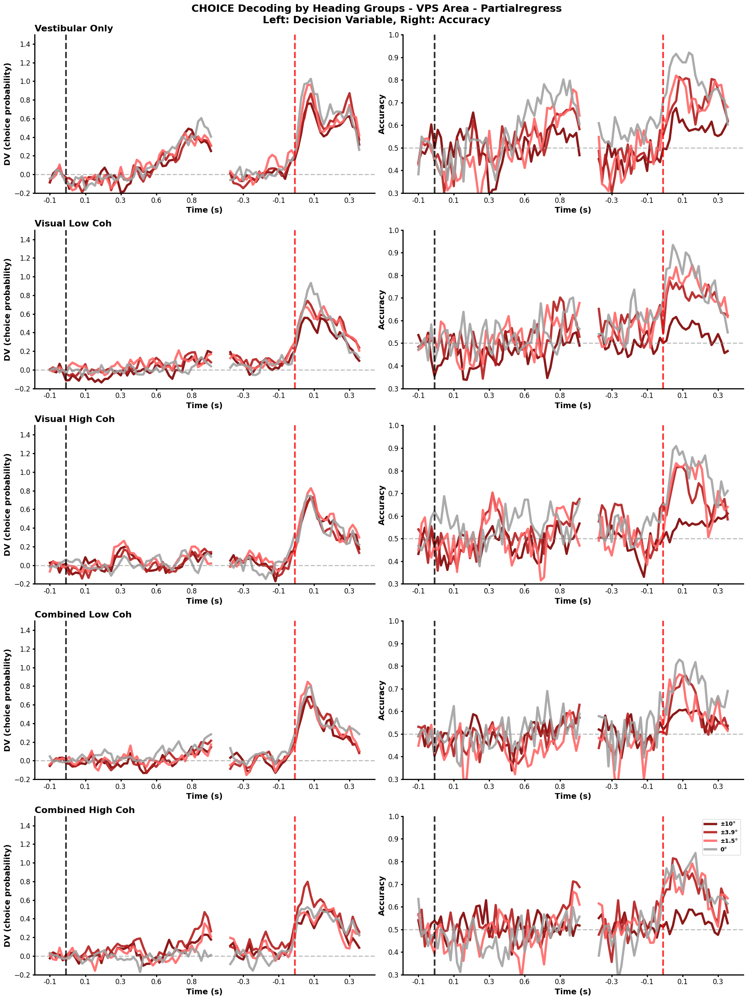


PROCESSING AREA: VPS - REGRESSION: decoders_noregress

  Vestibular Only (mod=1, coh=1):
    Processing ±10°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±3.9°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±1.5°...
      Processing stimOn...
      Processing saccOnset...
    Processing 0°...
      Processing stimOn...
      Processing saccOnset...

  Visual Low Coh (mod=2, coh=1):
    Processing ±10°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±3.9°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±1.5°...
      Processing stimOn...
      Processing saccOnset...
    Processing 0°...
      Processing stimOn...
      Processing saccOnset...

  Visual High Coh (mod=2, coh=2):
    Processing ±10°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±3.9°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±1.5°...
      Processing

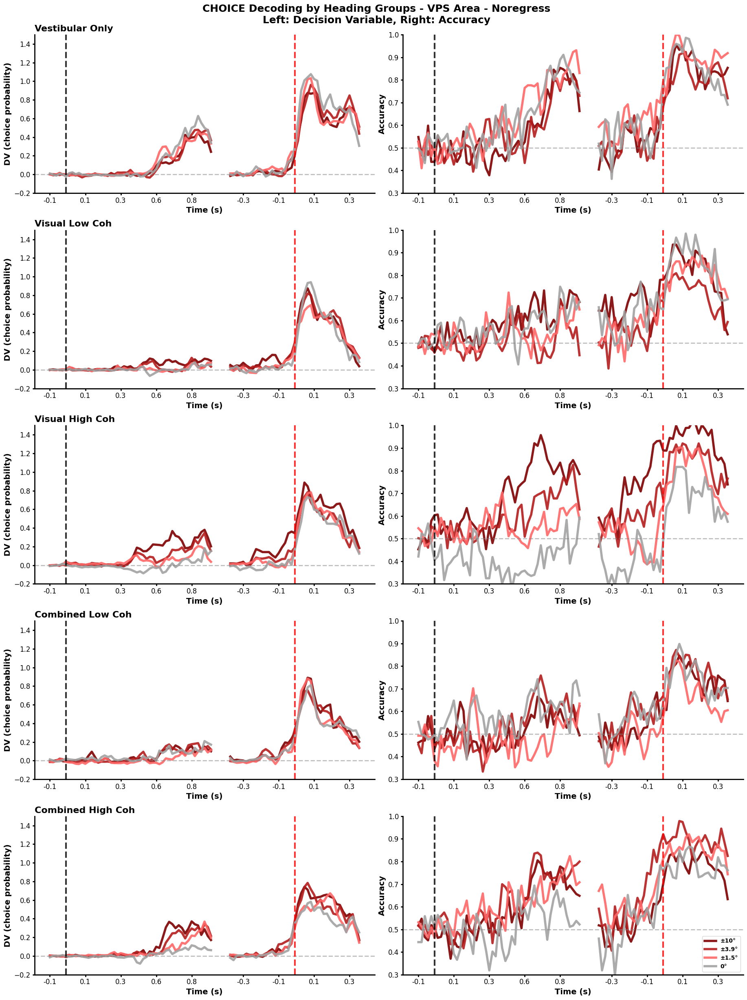


PROCESSING AREA: MST - REGRESSION: decoders_partialregress

  Vestibular Only (mod=1, coh=1):
    Processing ±10°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±3.9°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±1.5°...
      Processing stimOn...
      Processing saccOnset...
    Processing 0°...
      Processing stimOn...
      Processing saccOnset...

  Visual Low Coh (mod=2, coh=1):
    Processing ±10°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±3.9°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±1.5°...
      Processing stimOn...
      Processing saccOnset...
    Processing 0°...
      Processing stimOn...
      Processing saccOnset...

  Visual High Coh (mod=2, coh=2):
    Processing ±10°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±3.9°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±1.5°...
      Proce

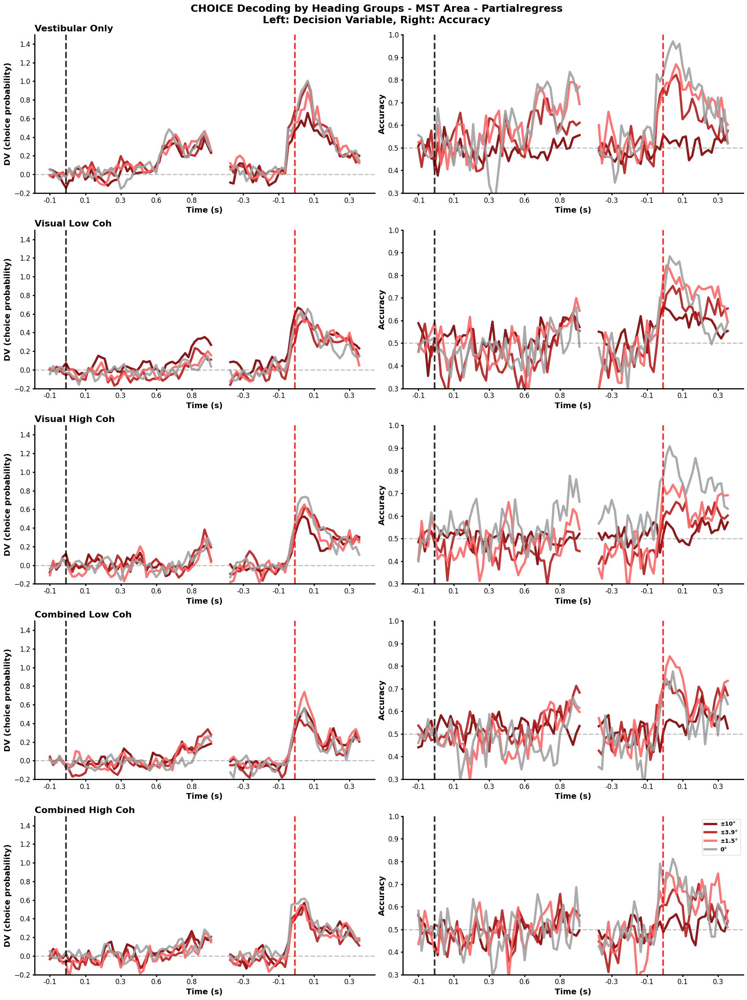


PROCESSING AREA: MST - REGRESSION: decoders_noregress

  Vestibular Only (mod=1, coh=1):
    Processing ±10°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±3.9°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±1.5°...
      Processing stimOn...
      Processing saccOnset...
    Processing 0°...
      Processing stimOn...
      Processing saccOnset...

  Visual Low Coh (mod=2, coh=1):
    Processing ±10°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±3.9°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±1.5°...
      Processing stimOn...
      Processing saccOnset...
    Processing 0°...
      Processing stimOn...
      Processing saccOnset...

  Visual High Coh (mod=2, coh=2):
    Processing ±10°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±3.9°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±1.5°...
      Processing

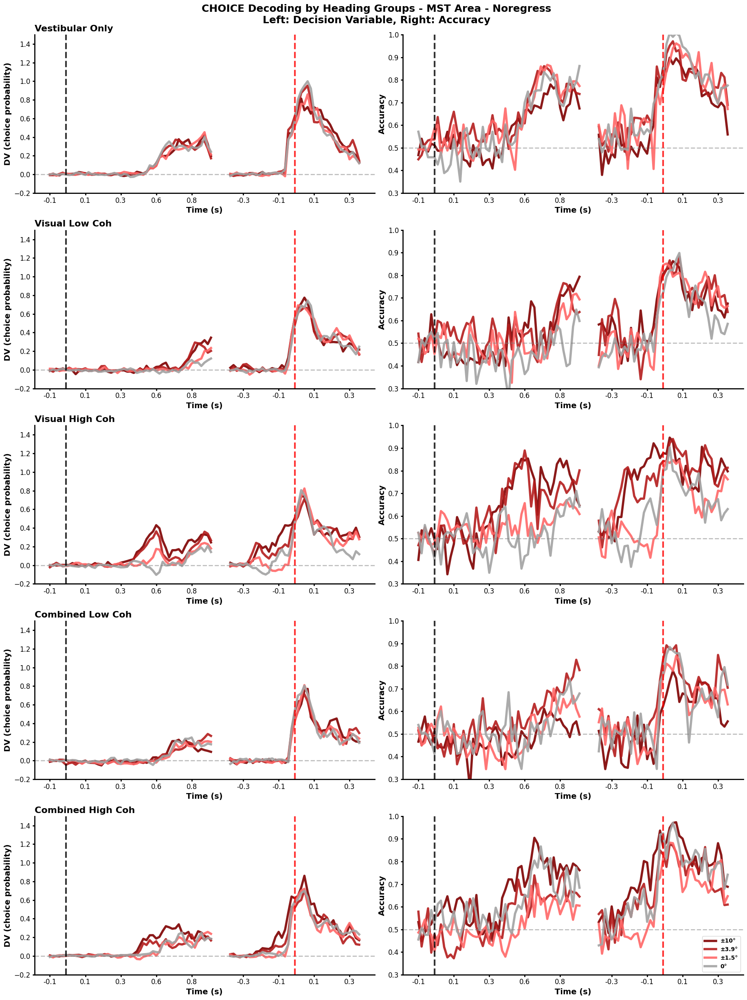


ALL FIGURES GENERATED!
Generated 4 figures:
- choice_decoding_VPS_decoders_partialregress_by_heading_combined_all5conditions_zarya.png
  (VPS area with Partialregress method)
- choice_decoding_VPS_decoders_noregress_by_heading_combined_all5conditions_zarya.png
  (VPS area with Noregress method)
- choice_decoding_MST_decoders_partialregress_by_heading_combined_all5conditions_zarya.png
  (MST area with Partialregress method)
- choice_decoding_MST_decoders_noregress_by_heading_combined_all5conditions_zarya.png
  (MST area with Noregress method)


In [4]:
# Define heading groups with colors (indices, color) - removed 'All' condition
heading_groups = {
    '±10°': ([1, 7], "#7E0000"),
    '±3.9°': ([2, 6], "#B41D1D"),
    '±1.5°': ([3, 5], "#FF6767"),
    '0°': ([4], "#A2A2A2")
}

targets_to_plot = ['choice']
areas = ['VPS', 'MST']  # Both brain areas
regression_methods = ['decoders_partialregress', 'decoders_noregress']  # Both regression methods

# Updated to include all 5 conditions
selected_conditions = {
    'Vestibular Only': {'mod': 1, 'coh': 1},
    'Visual Low Coh': {'mod': 2, 'coh': 1},
    'Visual High Coh': {'mod': 2, 'coh': 2},
    'Combined Low Coh': {'mod': 3, 'coh': 1},
    'Combined High Coh': {'mod': 3, 'coh': 2}
}

# Only use stimOn and saccOnset alignments
selected_alignments = ['stimOn', 'saccOnset']

for target in targets_to_plot:
    print(f"\n{'#'*80}")
    print(f"PROCESSING TARGET: {target.upper()} - BY HEADING GROUPS")
    print(f"{'#'*80}")
    
    # Get time axes for both alignments
    stimon_time_axis = time_axes_dots3DMP['stimOn']
    saccade_time_axis = time_axes_dots3DMP['saccOnset']
    
    # For saccOnset, only use from -400ms to end
    saccade_start_idx = np.where(saccade_time_axis >= -0.4)[0][0]
    saccade_time_axis_trimmed = saccade_time_axis[saccade_start_idx:]
    
    # Create combined x-axis positions (indices) and labels
    stimon_indices = np.arange(len(stimon_time_axis))
    gap_size = 5  # Gap between alignments (in index units)
    saccade_indices = np.arange(len(saccade_time_axis_trimmed)) + len(stimon_time_axis) + gap_size
    
    # Create combined time labels and tick positions
    combined_indices = np.concatenate([stimon_indices, saccade_indices])
    combined_time_labels = np.concatenate([stimon_time_axis, saccade_time_axis_trimmed])
    
    # Loop through each brain area and regression method combination
    for area in areas:
        for regression_method in regression_methods:
            print(f"\n{'='*60}")
            print(f"PROCESSING AREA: {area} - REGRESSION: {regression_method}")
            print(f"{'='*60}")
            
            baseline_corrections = {}
            
            # Create figure: 5 conditions x 2 measures
            fig, axes = plt.subplots(5, 2, figsize=(20, 25))
            
            # Process each condition
            for i, (condition_name, condition_params) in enumerate(selected_conditions.items()):
                mod = condition_params['mod']
                coh = condition_params['coh']
                
                print(f"\n  {condition_name} (mod={mod}, coh={coh}):")
                
                # Set target-specific labels
                if target == 'choice':
                    ylabel = 'DV (choice probability)'
                elif target == 'PDW':
                    ylabel = 'DV (confidence)'
                
                # Process each heading group for this condition
                for group_name, (heading_indices, color) in heading_groups.items():
                    print(f"    Processing {group_name}...")
                    
                    # Initialize baseline corrections for this heading group and condition
                    condition_key = f"{group_name}_{condition_name}"
                    if condition_key not in baseline_corrections:
                        baseline_corrections[condition_key] = {
                            'dv': 0,
                            'accuracy': 0
                        }
                    
                    # Store data for both alignments SEPARATELY
                    stimon_plot_indices = []
                    stimon_dv_values = []
                    stimon_accuracy_values = []
                    
                    saccade_plot_indices = []
                    saccade_dv_values = []
                    saccade_accuracy_values = []
                    
                    for alignment in selected_alignments:
                        print(f"      Processing {alignment}...")
                        
                        # Get the correct time axis and plot indices for this alignment
                        if alignment == 'stimOn':
                            time_axis = stimon_time_axis
                            plot_indices = stimon_indices
                            current_plot_indices = stimon_plot_indices
                            current_dv_values = stimon_dv_values
                            current_accuracy_values = stimon_accuracy_values
                        elif alignment == 'saccOnset':
                            time_axis = saccade_time_axis_trimmed
                            plot_indices = saccade_indices
                            current_plot_indices = saccade_plot_indices
                            current_dv_values = saccade_dv_values
                            current_accuracy_values = saccade_accuracy_values
                        
                        # Collect all trials for this alignment
                        all_trials = []
                        successful_dates = 0
                        
                        for date in dates:
                            filepath = get_filepath(date, area, alignment, target, mod, coh, regression=regression_method)
                            
                            try:
                                results = np.load(filepath, allow_pickle=True).item()
                                trial_results = results['trial_results']
                                all_trials.extend(trial_results)
                                successful_dates += 1
                            except Exception as e:
                                print(f"        Warning: Could not load {filepath}: {e}")
                                continue
                        
                        if successful_dates == 0:
                            print(f"        No data found for {condition_name}, {alignment}")
                            continue
                        
                        # Store DV and accuracy for each time point
                        dv_by_time = {t: [] for t in range(len(time_axis))}
                        accuracy_by_time = {t: [] for t in range(len(time_axis))}
                        
                        for trial in all_trials:
                            if 'test_behavior' in trial and 'headingInd' in trial['test_behavior']:
                                test_heading_indices = trial['test_behavior']['headingInd']
                                
                                # Create mask for samples that match this heading group
                                heading_mask = np.isin(test_heading_indices, heading_indices)
                                
                                if not np.any(heading_mask):
                                    continue
                                
                                # Filter trial data
                                y_test_filtered = np.array(trial['y_test'])[heading_mask]
                                y_proba_filtered = np.array(trial['y_proba'])[heading_mask]
                                y_pred_filtered = np.array(trial['y_pred'])[heading_mask]
                                
                                # Calculate DV and accuracy for this trial
                                trial_dvs = []
                                trial_correct = []
                                
                                for y_t, y_p, y_pred in zip(y_test_filtered, y_proba_filtered, y_pred_filtered):
                                    dv = calculate_decision_variable(y_t, y_p)
                                    trial_dvs.append(dv)
                                    trial_correct.append(1 if y_pred == y_t else 0)
                                
                                if trial_dvs:
                                    trial_mean_dv = np.mean(trial_dvs)
                                    trial_mean_accuracy = np.mean(trial_correct)
                                    
                                    # Get time index from trial
                                    time_idx = trial['time']
                                    if alignment == 'saccOnset':
                                        # Adjust index for trimmed saccade data
                                        time_idx = time_idx - saccade_start_idx
                                    
                                    if 0 <= time_idx < len(time_axis):
                                        dv_by_time[time_idx].append(trial_mean_dv)
                                        accuracy_by_time[time_idx].append(trial_mean_accuracy)
                        
                        # Calculate means for each time point and store with plot indices
                        for time_idx in range(len(time_axis)):
                            if len(dv_by_time[time_idx]) > 0:
                                current_plot_indices.append(plot_indices[time_idx])
                                current_dv_values.append(np.mean(dv_by_time[time_idx]))
                                current_accuracy_values.append(np.mean(accuracy_by_time[time_idx]))
                    
                    # Calculate baseline correction from stimOn data only
                    if baseline_corrections[condition_key]['dv'] == 0:
                        if stimon_plot_indices:
                            # Only use pre-stimulus baseline (time < 0)
                            baseline_dv_values = []
                            baseline_acc_values = []
                            for idx, plot_idx in enumerate(stimon_plot_indices):
                                if stimon_time_axis[plot_idx] < 0:
                                    baseline_dv_values.append(stimon_dv_values[idx])
                                    baseline_acc_values.append(stimon_accuracy_values[idx])
                            
                            if baseline_dv_values:
                                baseline_corrections[condition_key]['dv'] = np.mean(baseline_dv_values)
                            if baseline_acc_values:
                                baseline_corrections[condition_key]['accuracy'] = np.mean(baseline_acc_values)
                    
                    # Apply baseline corrections
                    correct_baseline_dv = baseline_corrections[condition_key]['dv']
                    correct_baseline_accuracy = baseline_corrections[condition_key]['accuracy']
                    
                    # Plot StimOn data (FIRST SEGMENT)
                    if stimon_plot_indices:
                        stimon_dv_corrected = [val - correct_baseline_dv for val in stimon_dv_values]
                        stimon_accuracy_corrected = [val - correct_baseline_accuracy + 0.5 for val in stimon_accuracy_values]
                        
                        # Plot DV - StimOn segment
                        ax_dv = axes[i, 0]
                        ax_dv.plot(stimon_plot_indices, stimon_dv_corrected, 
                                   color=color, linestyle='-', linewidth=4, 
                                   label=group_name, alpha=0.9)
                        
                        # Plot Accuracy - StimOn segment
                        ax_accuracy = axes[i, 1]
                        ax_accuracy.plot(stimon_plot_indices, stimon_accuracy_corrected, 
                                         color=color, linestyle='-', linewidth=4, 
                                         label=group_name, alpha=0.9)
                    
                    # Plot Saccade data (SECOND SEGMENT - NO CONNECTION)
                    if saccade_plot_indices:
                        saccade_dv_corrected = [val - correct_baseline_dv for val in saccade_dv_values]
                        saccade_accuracy_corrected = [val - correct_baseline_accuracy + 0.5 for val in saccade_accuracy_values]
                        
                        # Plot DV - Saccade segment (separate line, no connection)
                        ax_dv = axes[i, 0]
                        ax_dv.plot(saccade_plot_indices, saccade_dv_corrected, 
                                   color=color, linestyle='-', linewidth=4, alpha=0.9)
                        
                        # Plot Accuracy - Saccade segment (separate line, no connection)
                        ax_accuracy = axes[i, 1]
                        ax_accuracy.plot(saccade_plot_indices, saccade_accuracy_corrected, 
                                         color=color, linestyle='-', linewidth=4, alpha=0.9)
                
                # Format subplots
                for col in range(2):
                    ax = axes[i, col]
                    
                    # Remove top and right spines
                    ax.spines['top'].set_visible(False)
                    ax.spines['right'].set_visible(False)
                    
                    # Add reference lines
                    ax.axhline(y=0.5 if col == 1 else 0, color='gray', linestyle='--', alpha=0.5, linewidth=2)
                    
                    # Add event alignment markers as dashed lines
                    stimon_zero_idx = np.where(stimon_time_axis >= 0)[0][0]  # Index where stimOn time = 0
                    saccade_zero_idx = saccade_indices[0] + np.where(saccade_time_axis_trimmed >= 0)[0][0]  # Index for saccade onset
                    
                    ax.axvline(x=stimon_zero_idx, color='black', linestyle='--', alpha=0.8, linewidth=3)
                    ax.axvline(x=saccade_zero_idx, color='red', linestyle='--', alpha=0.8, linewidth=3)
                    
                    # Set custom x-axis ticks and labels
                    # Select subset of ticks for readability
                    tick_step = max(1, len(combined_indices) // 8)  # Show ~8 ticks
                    tick_indices = combined_indices[::tick_step]
                    tick_labels = [f'{t:.1f}' for t in combined_time_labels[::tick_step]]
                    
                    ax.set_xticks(tick_indices)
                    ax.set_xticklabels(tick_labels)
                    

                    
                    ax.set_xlabel('Time (s)', fontsize=14, fontweight='bold')
                    
                    if col == 0:
                        ax.set_ylabel(ylabel, fontsize=14, fontweight='bold')
                        ax.set_title(f'{condition_name}', fontsize=16, fontweight='bold', loc='left')
                        ax.set_ylim(-0.2, 1.5)
                    else:
                        ax.set_ylabel('Accuracy', fontsize=14, fontweight='bold')
                        ax.set_ylim(0.3, 1.0)
                    
                    # Add legend to bottom right subplot
                    if i == len(selected_conditions) - 1 and col == 1:
                        ax.legend(fontsize=12, prop={'weight': 'bold'})
                    
                    # Make remaining spines thicker
                    ax.spines['left'].set_linewidth(2)
                    ax.spines['bottom'].set_linewidth(2)
                    ax.tick_params(width=2, labelsize=12)
            
            # Create title that includes both area and regression method
            regression_title = regression_method.replace('decoders_', '').replace('_', ' ').title()
            fig.suptitle(f'{target.upper()} Decoding by Heading Groups - {area} Area - {regression_title}\nLeft: Decision Variable, Right: Accuracy', 
                         fontsize=18, fontweight='bold', y=0.98)
            
            plt.tight_layout()
            plt.subplots_adjust(top=0.95, left=0.08, right=0.95)
            
            # Create filename that includes both area and regression method
            save_filename = f"D:\\Neural-Pipeline\\results\\analysis_population\\{target}_decoding_{area}_{regression_method}_by_heading_combined_all5conditions_zarya.png"
            plt.savefig(save_filename, dpi=300, bbox_inches='tight')
            print(f"\nFigure saved as: {save_filename}")
            
            plt.show()

print("\n" + "="*80)
print("ALL FIGURES GENERATED!")
print("="*80)
print("Generated 4 figures:")
for area in areas:
    for regression_method in regression_methods:
        regression_title = regression_method.replace('decoders_', '').replace('_', ' ').title()
        print(f"- {target}_decoding_{area}_{regression_method}_by_heading_combined_all5conditions_zarya.png")
        print(f"  ({area} area with {regression_title} method)")

### Stimulus by headings


################################################################################
PROCESSING TARGET: STIMULUS - BY HEADING GROUPS
################################################################################

PROCESSING AREA: VPS - REGRESSION: decoders_partialregress

  Vestibular Only (mod=1, coh=1):
    Processing ±10°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±3.9°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±1.5°...
      Processing stimOn...
      Processing saccOnset...

  Visual Low Coh (mod=2, coh=1):
    Processing ±10°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±3.9°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±1.5°...
      Processing stimOn...
      Processing saccOnset...

  Visual High Coh (mod=2, coh=2):
    Processing ±10°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±3.9°...
      Processing stimOn...
      Proc

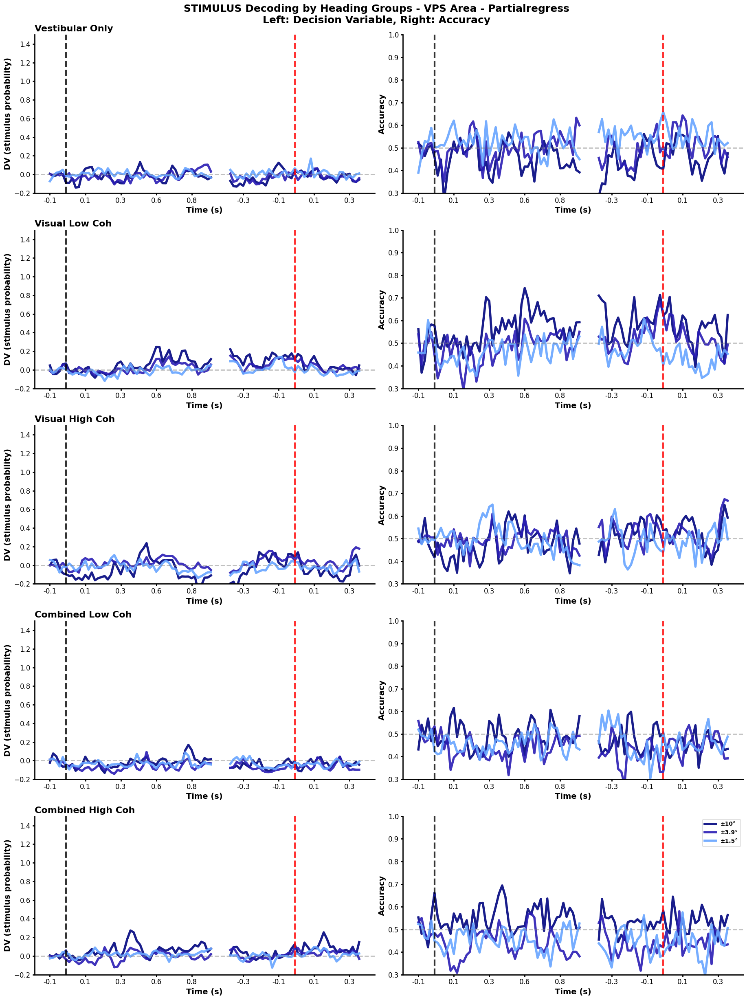


PROCESSING AREA: VPS - REGRESSION: decoders_noregress

  Vestibular Only (mod=1, coh=1):
    Processing ±10°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±3.9°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±1.5°...
      Processing stimOn...
      Processing saccOnset...

  Visual Low Coh (mod=2, coh=1):
    Processing ±10°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±3.9°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±1.5°...
      Processing stimOn...
      Processing saccOnset...

  Visual High Coh (mod=2, coh=2):
    Processing ±10°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±3.9°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±1.5°...
      Processing stimOn...
      Processing saccOnset...

  Combined Low Coh (mod=3, coh=1):
    Processing ±10°...
      Processing stimOn...
      Processing saccOnset...

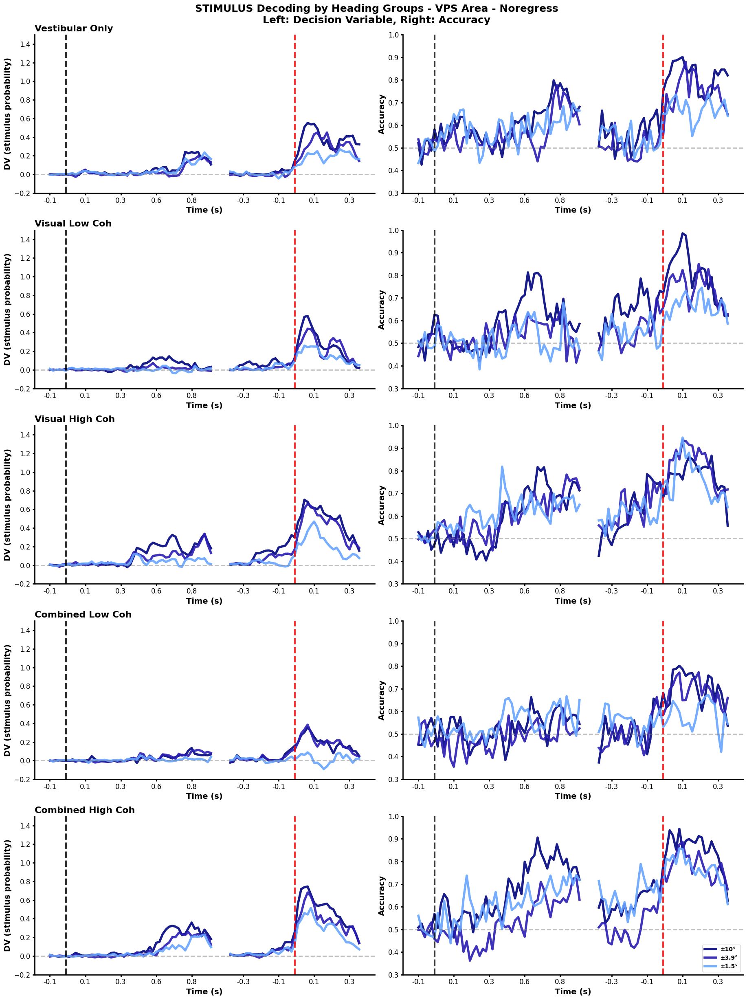


PROCESSING AREA: MST - REGRESSION: decoders_partialregress

  Vestibular Only (mod=1, coh=1):
    Processing ±10°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±3.9°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±1.5°...
      Processing stimOn...
      Processing saccOnset...

  Visual Low Coh (mod=2, coh=1):
    Processing ±10°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±3.9°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±1.5°...
      Processing stimOn...
      Processing saccOnset...

  Visual High Coh (mod=2, coh=2):
    Processing ±10°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±3.9°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±1.5°...
      Processing stimOn...
      Processing saccOnset...

  Combined Low Coh (mod=3, coh=1):
    Processing ±10°...
      Processing stimOn...
      Processing saccOns

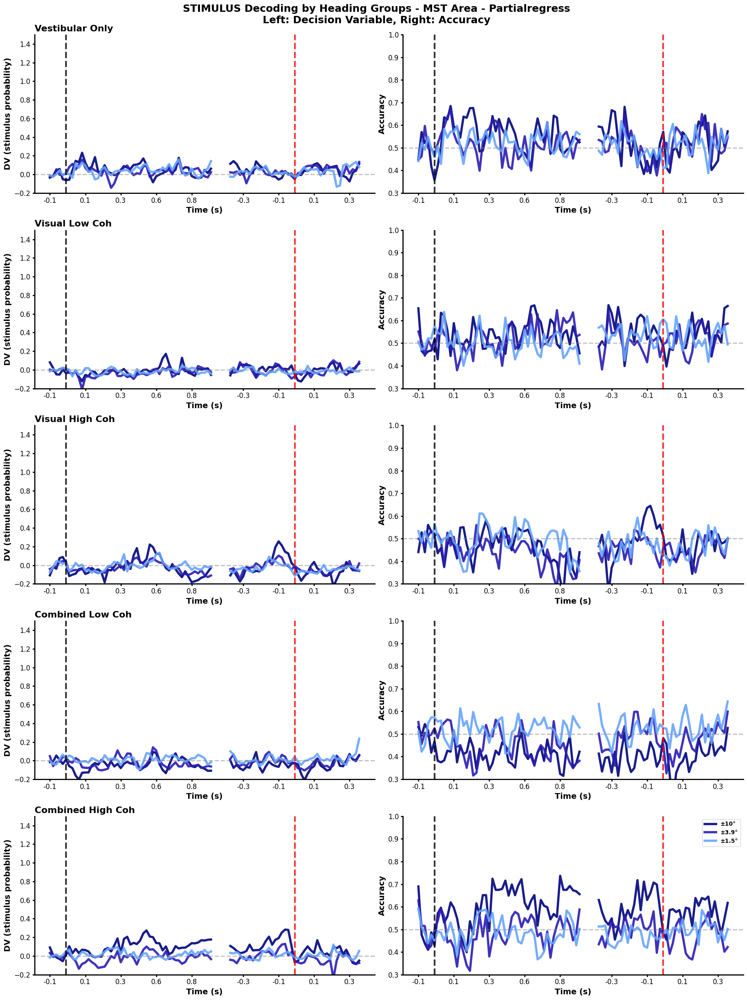


PROCESSING AREA: MST - REGRESSION: decoders_noregress

  Vestibular Only (mod=1, coh=1):
    Processing ±10°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±3.9°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±1.5°...
      Processing stimOn...
      Processing saccOnset...

  Visual Low Coh (mod=2, coh=1):
    Processing ±10°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±3.9°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±1.5°...
      Processing stimOn...
      Processing saccOnset...

  Visual High Coh (mod=2, coh=2):
    Processing ±10°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±3.9°...
      Processing stimOn...
      Processing saccOnset...
    Processing ±1.5°...
      Processing stimOn...
      Processing saccOnset...

  Combined Low Coh (mod=3, coh=1):
    Processing ±10°...
      Processing stimOn...
      Processing saccOnset...

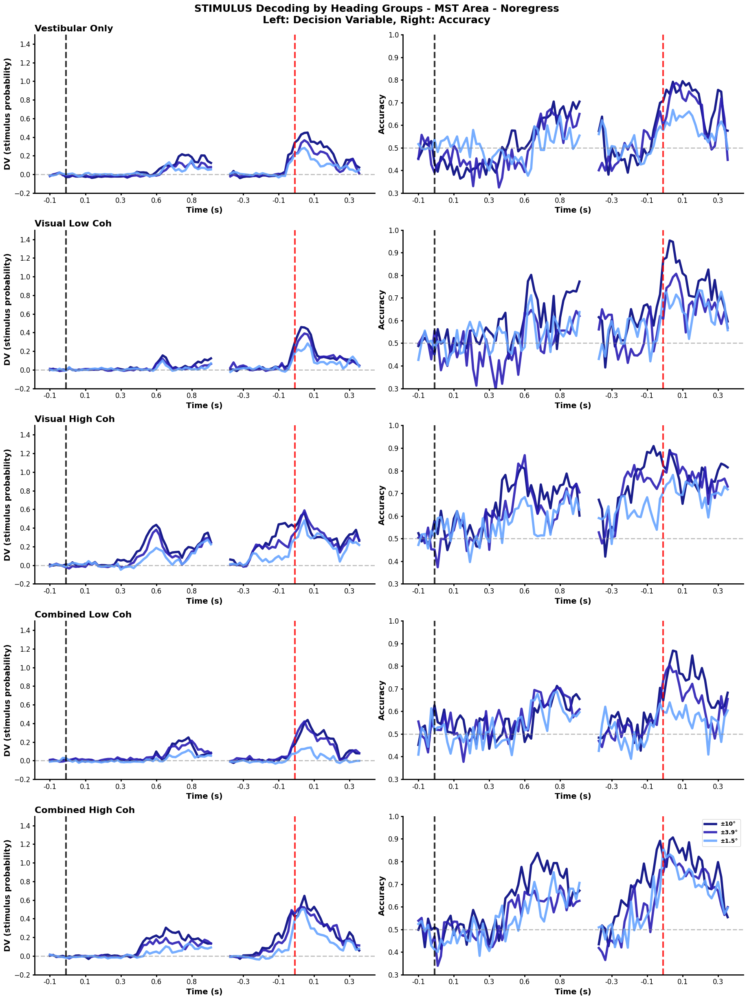


ALL STIMULUS DECODING FIGURES GENERATED!
Generated 4 figures:
- stimulus_decoding_VPS_decoders_partialregress_by_heading_combined_all5conditions_zarya.png
  (VPS area with Partialregress method)
- stimulus_decoding_VPS_decoders_noregress_by_heading_combined_all5conditions_zarya.png
  (VPS area with Noregress method)
- stimulus_decoding_MST_decoders_partialregress_by_heading_combined_all5conditions_zarya.png
  (MST area with Partialregress method)
- stimulus_decoding_MST_decoders_noregress_by_heading_combined_all5conditions_zarya.png
  (MST area with Noregress method)


In [7]:
# Define heading groups with colors (indices, color) - updated colors for stimulus decoder
heading_groups = {
    '±10°': ([1, 7], "#00047E"),
    '±3.9°': ([2, 6], "#2A1DB4"),
    '±1.5°': ([3, 5], "#67A4FF")
    # '0°': ([4], "#A2A2A2")  # Removed for stimulus decoder as it's not informative
}

targets_to_plot = ['stimulus']  # Changed to stimulus decoder
areas = ['VPS', 'MST']  # Both brain areas
regression_methods = ['decoders_partialregress', 'decoders_noregress']  # Both regression methods

# Updated to include all 5 conditions for stimulus decoder
selected_conditions = {
    'Vestibular Only': {'mod': 1, 'coh': 1},
    'Visual Low Coh': {'mod': 2, 'coh': 1},
    'Visual High Coh': {'mod': 2, 'coh': 2},
    'Combined Low Coh': {'mod': 3, 'coh': 1},
    'Combined High Coh': {'mod': 3, 'coh': 2}
}

# Only use stimOn and saccOnset alignments
selected_alignments = ['stimOn', 'saccOnset']

for target in targets_to_plot:
    print(f"\n{'#'*80}")
    print(f"PROCESSING TARGET: {target.upper()} - BY HEADING GROUPS")
    print(f"{'#'*80}")
    
    # Get time axes for both alignments
    stimon_time_axis = time_axes_dots3DMP['stimOn']
    saccade_time_axis = time_axes_dots3DMP['saccOnset']
    
    # For saccOnset, only use from -400ms to end
    saccade_start_idx = np.where(saccade_time_axis >= -0.4)[0][0]
    saccade_time_axis_trimmed = saccade_time_axis[saccade_start_idx:]
    
    # Create combined x-axis positions (indices) and labels
    stimon_indices = np.arange(len(stimon_time_axis))
    gap_size = 5  # Gap between alignments (in index units)
    saccade_indices = np.arange(len(saccade_time_axis_trimmed)) + len(stimon_time_axis) + gap_size
    
    # Create combined time labels and tick positions
    combined_indices = np.concatenate([stimon_indices, saccade_indices])
    combined_time_labels = np.concatenate([stimon_time_axis, saccade_time_axis_trimmed])
    
    # Loop through each brain area and regression method combination
    for area in areas:
        for regression_method in regression_methods:
            print(f"\n{'='*60}")
            print(f"PROCESSING AREA: {area} - REGRESSION: {regression_method}")
            print(f"{'='*60}")
            
            baseline_corrections = {}
            
            # Create figure: 5 conditions x 2 measures
            fig, axes = plt.subplots(5, 2, figsize=(20, 25))
            
            # Process each condition
            for i, (condition_name, condition_params) in enumerate(selected_conditions.items()):
                mod = condition_params['mod']
                coh = condition_params['coh']
                
                print(f"\n  {condition_name} (mod={mod}, coh={coh}):")
                
                # Set target-specific labels
                if target == 'stimulus':
                    ylabel = 'DV (stimulus probability)'
                elif target == 'choice':
                    ylabel = 'DV (choice probability)'
                elif target == 'PDW':
                    ylabel = 'DV (confidence)'
                
                # Process each heading group for this condition
                for group_name, (heading_indices, color) in heading_groups.items():
                    print(f"    Processing {group_name}...")
                    
                    # Initialize baseline corrections for this heading group and condition
                    condition_key = f"{group_name}_{condition_name}"
                    if condition_key not in baseline_corrections:
                        baseline_corrections[condition_key] = {
                            'dv': 0,
                            'accuracy': 0
                        }
                    
                    # Store data for both alignments SEPARATELY
                    stimon_plot_indices = []
                    stimon_dv_values = []
                    stimon_accuracy_values = []
                    
                    saccade_plot_indices = []
                    saccade_dv_values = []
                    saccade_accuracy_values = []
                    
                    for alignment in selected_alignments:
                        print(f"      Processing {alignment}...")
                        
                        # Get the correct time axis and plot indices for this alignment
                        if alignment == 'stimOn':
                            time_axis = stimon_time_axis
                            plot_indices = stimon_indices
                            current_plot_indices = stimon_plot_indices
                            current_dv_values = stimon_dv_values
                            current_accuracy_values = stimon_accuracy_values
                        elif alignment == 'saccOnset':
                            time_axis = saccade_time_axis_trimmed
                            plot_indices = saccade_indices
                            current_plot_indices = saccade_plot_indices
                            current_dv_values = saccade_dv_values
                            current_accuracy_values = saccade_accuracy_values
                        
                        # Collect all trials for this alignment
                        all_trials = []
                        successful_dates = 0
                        
                        for date in dates:
                            filepath = get_filepath(date, area, alignment, target, mod, coh, regression=regression_method)
                            
                            try:
                                results = np.load(filepath, allow_pickle=True).item()
                                trial_results = results['trial_results']
                                all_trials.extend(trial_results)
                                successful_dates += 1
                            except Exception as e:
                                print(f"        Warning: Could not load {filepath}: {e}")
                                continue
                        
                        if successful_dates == 0:
                            print(f"        No data found for {condition_name}, {alignment}")
                            continue
                        
                        # Store DV and accuracy for each time point
                        dv_by_time = {t: [] for t in range(len(time_axis))}
                        accuracy_by_time = {t: [] for t in range(len(time_axis))}
                        
                        for trial in all_trials:
                            if 'test_behavior' in trial and 'headingInd' in trial['test_behavior']:
                                test_heading_indices = trial['test_behavior']['headingInd']
                                
                                # Create mask for samples that match this heading group
                                heading_mask = np.isin(test_heading_indices, heading_indices)
                                
                                if not np.any(heading_mask):
                                    continue
                                
                                # Filter trial data
                                y_test_filtered = np.array(trial['y_test'])[heading_mask]
                                y_proba_filtered = np.array(trial['y_proba'])[heading_mask]
                                y_pred_filtered = np.array(trial['y_pred'])[heading_mask]
                                
                                # Calculate DV and accuracy for this trial
                                trial_dvs = []
                                trial_correct = []
                                
                                for y_t, y_p, y_pred in zip(y_test_filtered, y_proba_filtered, y_pred_filtered):
                                    dv = calculate_decision_variable(y_t, y_p)
                                    trial_dvs.append(dv)
                                    trial_correct.append(1 if y_pred == y_t else 0)
                                
                                if trial_dvs:
                                    trial_mean_dv = np.mean(trial_dvs)
                                    trial_mean_accuracy = np.mean(trial_correct)
                                    
                                    # Get time index from trial
                                    time_idx = trial['time']
                                    if alignment == 'saccOnset':
                                        # Adjust index for trimmed saccade data
                                        time_idx = time_idx - saccade_start_idx
                                    
                                    if 0 <= time_idx < len(time_axis):
                                        dv_by_time[time_idx].append(trial_mean_dv)
                                        accuracy_by_time[time_idx].append(trial_mean_accuracy)
                        
                        # Calculate means for each time point and store with plot indices
                        for time_idx in range(len(time_axis)):
                            if len(dv_by_time[time_idx]) > 0:
                                current_plot_indices.append(plot_indices[time_idx])
                                current_dv_values.append(np.mean(dv_by_time[time_idx]))
                                current_accuracy_values.append(np.mean(accuracy_by_time[time_idx]))
                    
                    # Calculate baseline correction from stimOn data only
                    if baseline_corrections[condition_key]['dv'] == 0:
                        if stimon_plot_indices:
                            # Only use pre-stimulus baseline (time < 0)
                            baseline_dv_values = []
                            baseline_acc_values = []
                            for idx, plot_idx in enumerate(stimon_plot_indices):
                                if stimon_time_axis[plot_idx] < 0:
                                    baseline_dv_values.append(stimon_dv_values[idx])
                                    baseline_acc_values.append(stimon_accuracy_values[idx])
                            
                            if baseline_dv_values:
                                baseline_corrections[condition_key]['dv'] = np.mean(baseline_dv_values)
                            if baseline_acc_values:
                                baseline_corrections[condition_key]['accuracy'] = np.mean(baseline_acc_values)
                    
                    # Apply baseline corrections
                    correct_baseline_dv = baseline_corrections[condition_key]['dv']
                    correct_baseline_accuracy = baseline_corrections[condition_key]['accuracy']
                    
                    # Plot StimOn data (FIRST SEGMENT)
                    if stimon_plot_indices:
                        stimon_dv_corrected = [val - correct_baseline_dv for val in stimon_dv_values]
                        stimon_accuracy_corrected = [val - correct_baseline_accuracy + 0.5 for val in stimon_accuracy_values]
                        
                        # Plot DV - StimOn segment
                        ax_dv = axes[i, 0]
                        ax_dv.plot(stimon_plot_indices, stimon_dv_corrected, 
                                   color=color, linestyle='-', linewidth=4, 
                                   label=group_name, alpha=0.9)
                        
                        # Plot Accuracy - StimOn segment
                        ax_accuracy = axes[i, 1]
                        ax_accuracy.plot(stimon_plot_indices, stimon_accuracy_corrected, 
                                         color=color, linestyle='-', linewidth=4, 
                                         label=group_name, alpha=0.9)
                    
                    # Plot Saccade data (SECOND SEGMENT - NO CONNECTION)
                    if saccade_plot_indices:
                        saccade_dv_corrected = [val - correct_baseline_dv for val in saccade_dv_values]
                        saccade_accuracy_corrected = [val - correct_baseline_accuracy + 0.5 for val in saccade_accuracy_values]
                        
                        # Plot DV - Saccade segment (separate line, no connection)
                        ax_dv = axes[i, 0]
                        ax_dv.plot(saccade_plot_indices, saccade_dv_corrected, 
                                   color=color, linestyle='-', linewidth=4, alpha=0.9)
                        
                        # Plot Accuracy - Saccade segment (separate line, no connection)
                        ax_accuracy = axes[i, 1]
                        ax_accuracy.plot(saccade_plot_indices, saccade_accuracy_corrected, 
                                         color=color, linestyle='-', linewidth=4, alpha=0.9)
                
                # Format subplots
                for col in range(2):
                    ax = axes[i, col]
                    
                    # Remove top and right spines
                    ax.spines['top'].set_visible(False)
                    ax.spines['right'].set_visible(False)
                    
                    # Add reference lines
                    ax.axhline(y=0.5 if col == 1 else 0, color='gray', linestyle='--', alpha=0.5, linewidth=2)
                    
                    # Add event alignment markers as dashed lines
                    stimon_zero_idx = np.where(stimon_time_axis >= 0)[0][0]  # Index where stimOn time = 0
                    saccade_zero_idx = saccade_indices[0] + np.where(saccade_time_axis_trimmed >= 0)[0][0]  # Index for saccade onset
                    
                    ax.axvline(x=stimon_zero_idx, color='black', linestyle='--', alpha=0.8, linewidth=3)
                    ax.axvline(x=saccade_zero_idx, color='red', linestyle='--', alpha=0.8, linewidth=3)
                    
                    # Set custom x-axis ticks and labels
                    # Select subset of ticks for readability
                    tick_step = max(1, len(combined_indices) // 8)  # Show ~8 ticks
                    tick_indices = combined_indices[::tick_step]
                    tick_labels = [f'{t:.1f}' for t in combined_time_labels[::tick_step]]
                    
                    ax.set_xticks(tick_indices)
                    ax.set_xticklabels(tick_labels)
                    
                    
                    ax.set_xlabel('Time (s)', fontsize=14, fontweight='bold')
                    
                    if col == 0:
                        ax.set_ylabel(ylabel, fontsize=14, fontweight='bold')
                        ax.set_title(f'{condition_name}', fontsize=16, fontweight='bold', loc='left')
                        ax.set_ylim(-0.2, 1.5)
                    else:
                        ax.set_ylabel('Accuracy', fontsize=14, fontweight='bold')
                        ax.set_ylim(0.3, 1.0)
                    
                    # Add legend to bottom right subplot
                    if i == len(selected_conditions) - 1 and col == 1:
                        ax.legend(fontsize=12, prop={'weight': 'bold'})
                    
                    # Make remaining spines thicker
                    ax.spines['left'].set_linewidth(2)
                    ax.spines['bottom'].set_linewidth(2)
                    ax.tick_params(width=2, labelsize=12)
            
            # Create title that includes both area and regression method
            regression_title = regression_method.replace('decoders_', '').replace('_', ' ').title()
            fig.suptitle(f'{target.upper()} Decoding by Heading Groups - {area} Area - {regression_title}\nLeft: Decision Variable, Right: Accuracy', 
                         fontsize=18, fontweight='bold', y=0.98)
            
            plt.tight_layout()
            plt.subplots_adjust(top=0.95, left=0.08, right=0.95)
            
            # Create filename that includes both area and regression method
            save_filename = f"D:\\Neural-Pipeline\\results\\analysis_population\\{target}_decoding_{area}_{regression_method}_by_heading_combined_all5conditions_zarya.png"
            plt.savefig(save_filename, dpi=300, bbox_inches='tight')
            print(f"\nFigure saved as: {save_filename}")
            
            plt.show()

print("\n" + "="*80)
print("ALL STIMULUS DECODING FIGURES GENERATED!")
print("="*80)
print("Generated 4 figures:")
for area in areas:
    for regression_method in regression_methods:
        regression_title = regression_method.replace('decoders_', '').replace('_', ' ').title()
        print(f"- stimulus_decoding_{area}_{regression_method}_by_heading_combined_all5conditions_zarya.png")
        print(f"  ({area} area with {regression_title} method)")

### Choice slope by time window
TODO: for the real value, need correction

Starting time window comparison analysis for DV and Accuracy slopes...

################################################################################
PROCESSING AREA: VPS
################################################################################

Processing VPS - decoders_partialregress

Time window: Early Stimulus (-500ms to -300ms)
  Number of time points: 10

Time window: Late Stimulus (-300ms to -100ms)
  Number of time points: 10

Time window: Saccade Prep (-100ms to 100ms)
  Number of time points: 10

Processing VPS - decoders_noregress

Time window: Early Stimulus (-500ms to -300ms)
  Number of time points: 10

Time window: Late Stimulus (-300ms to -100ms)
  Number of time points: 10

Time window: Saccade Prep (-100ms to 100ms)
  Number of time points: 10

Total slopes calculated for VPS: 960

Analyzing 960 slope measurements for VPS...
Figure saved as: D:\Neural-Pipeline\results\analysis_population\dv_accuracy_slopes_comparison_VPS_zarya.png


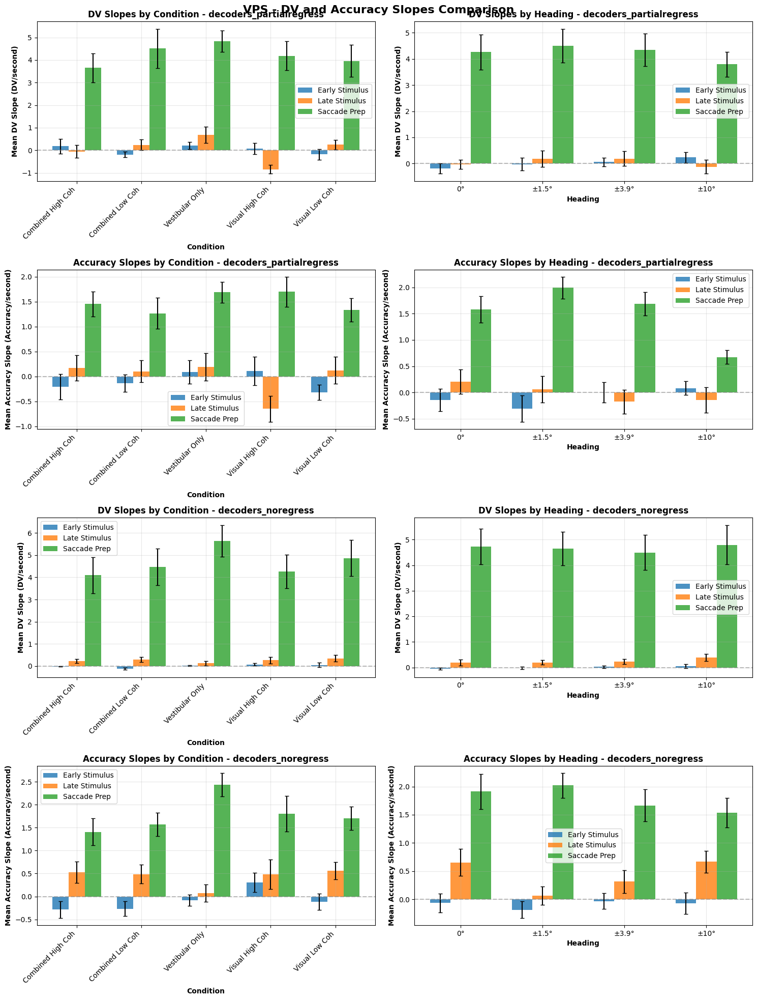


STATISTICAL SUMMARY - TIME WINDOW COMPARISON - VPS

DECODERS_PARTIALREGRESS:
--------------------------------------------------

DV SLOPES:
------------------------------
Overall statistics by time window:
                count      mean       std
time_window                              
Early Stimulus     80  0.016367  0.915141
Late Stimulus      80  0.052568  1.150449
Saccade Prep       80  4.228214  2.692134

ANOVA across time windows: F=149.552, p=0.000000

Pairwise t-tests between time windows:
  Early Stimulus vs Late Stimulus: t=-0.220, p=0.825956
  Early Stimulus vs Saccade Prep: t=-13.249, p=0.000000
  Late Stimulus vs Saccade Prep: t=-12.757, p=0.000000

Accuracy SLOPES:
------------------------------
Overall statistics by time window:
                count      mean       std
time_window                              
Early Stimulus     80 -0.093274  0.899106
Late Stimulus      80 -0.014395  1.055533
Saccade Prep       80  1.485451  1.040326

ANOVA across time windows: F=63

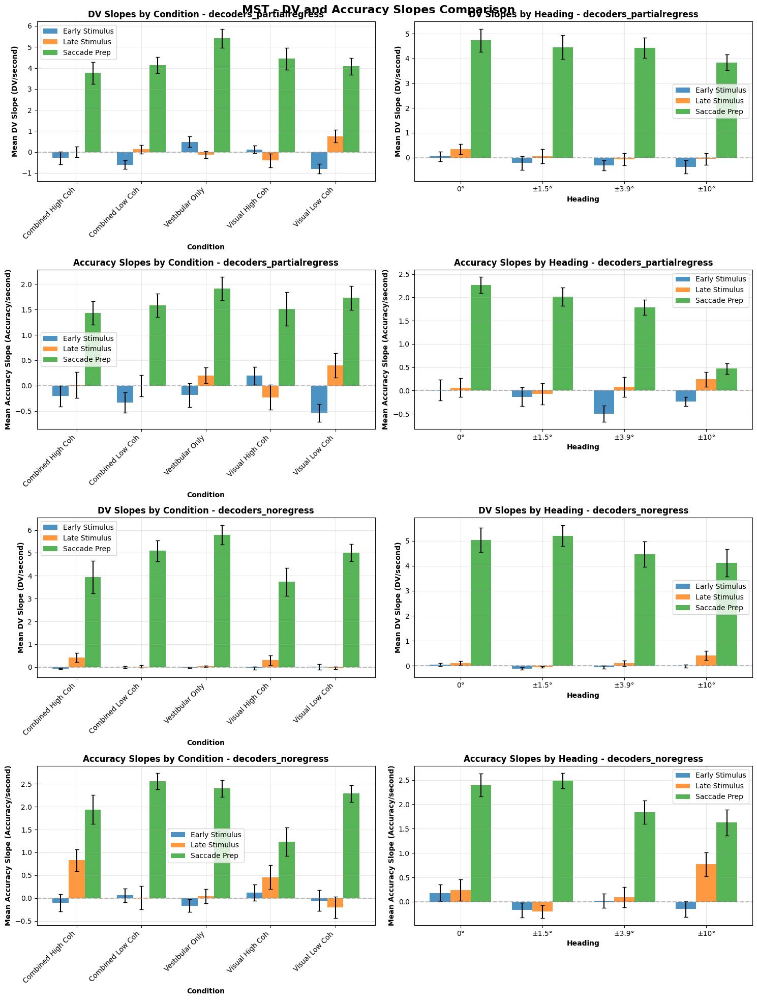


STATISTICAL SUMMARY - TIME WINDOW COMPARISON - MST

DECODERS_PARTIALREGRESS:
--------------------------------------------------

DV SLOPES:
------------------------------
Overall statistics by time window:
                count      mean       std
time_window                              
Early Stimulus     80 -0.217546  1.053751
Late Stimulus      80  0.067672  1.074109
Saccade Prep       80  4.364794  1.894307

ANOVA across time windows: F=270.274, p=0.000000

Pairwise t-tests between time windows:
  Early Stimulus vs Late Stimulus: t=-1.695, p=0.091968
  Early Stimulus vs Saccade Prep: t=-18.908, p=0.000000
  Late Stimulus vs Saccade Prep: t=-17.650, p=0.000000

Accuracy SLOPES:
------------------------------
Overall statistics by time window:
                count      mean       std
time_window                              
Early Stimulus     80 -0.211949  0.813711
Late Stimulus      80  0.078221  0.902226
Saccade Prep       80  1.632949  1.005695

ANOVA across time windows: F=94

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from scipy import stats

def calculate_slopes_multiple_windows(area):
    """
    Calculate slopes for both DV and accuracy across multiple time windows and regression methods
    """
    # Define time windows
    time_windows = {
        'Early Stimulus': (-0.5, -0.3),    # -500ms to -300ms
        'Late Stimulus': (-0.3, -0.1),     # -300ms to -100ms  
        'Around Saccade': (-0.1, 0.1)        # -100ms to +100ms
    }
    
    # Define conditions
    heading_groups = {
        '±10°': ([1, 7], "#7E0000"),
        '±3.9°': ([2, 6], "#B41D1D"),
        '±1.5°': ([3, 5], "#FF6767"),
        '0°': ([4], "#A2A2A2")
    }
    
    selected_conditions = {
        'Vestibular Only': {'mod': 1, 'coh': 1},
        'Visual Low Coh': {'mod': 2, 'coh': 1},
        'Visual High Coh': {'mod': 2, 'coh': 2},
        'Combined Low Coh': {'mod': 3, 'coh': 1},
        'Combined High Coh': {'mod': 3, 'coh': 2}
    }
    
    # Regression methods
    regression_methods = ['decoders_partialregress', 'decoders_noregress']
    
    target = 'choice'
    alignment = 'saccOnset'
    
    # Get time axis
    saccade_time_axis = time_axes_dots3DMP['saccOnset']
    
    all_results = []
    
    # Process each regression method
    for regression_method in regression_methods:
        print(f"\n{'='*60}")
        print(f"Processing {area} - {regression_method}")
        print(f"{'='*60}")
        
        # Process each time window
        for window_name, (window_start, window_end) in time_windows.items():
            print(f"\nTime window: {window_name} ({window_start*1000:.0f}ms to {window_end*1000:.0f}ms)")
            
            # Find indices for this time window
            window_mask = (saccade_time_axis >= window_start) & (saccade_time_axis <= window_end)
            window_indices = np.where(window_mask)[0]
            window_times = saccade_time_axis[window_mask]
            
            print(f"  Number of time points: {len(window_indices)}")
            
            if len(window_indices) < 3:
                print(f"  Skipping {window_name} - not enough time points")
                continue
            
            # Collect data for this window and regression method
            condition_data_dv = {}
            condition_data_accuracy = {}
            
            # Process each condition
            for condition_name, condition_params in selected_conditions.items():
                mod = condition_params['mod']
                coh = condition_params['coh']
                
                # Process each heading group
                for group_name, (heading_indices, color) in heading_groups.items():
                    
                    for date in dates:
                        filepath = get_filepath(date, area, alignment, target, mod, coh, regression=regression_method)
                        
                        try:
                            results = np.load(filepath, allow_pickle=True).item()
                            trial_results = results['trial_results']
                            
                            key = (condition_name, group_name, date)
                            if key not in condition_data_dv:
                                condition_data_dv[key] = {}
                                condition_data_accuracy[key] = {}
                            
                            # Process each time point in this window
                            for trial in trial_results:
                                if 'test_behavior' not in trial or 'headingInd' not in trial['test_behavior']:
                                    continue
                                    
                                test_heading_indices = trial['test_behavior']['headingInd']
                                test_pdw = trial['test_behavior']['PDW'] #####check this! for what I want
                                heading_mask = np.isin(test_heading_indices, heading_indices)
                                
                                if not np.any(heading_mask):
                                    continue
                                
                                time_idx = trial['time']
                                if time_idx not in window_indices:
                                    continue
                                
                                # Calculate DVs and accuracy
                                y_test_filtered = np.array(trial['y_test'])[heading_mask]
                                y_proba_filtered = np.array(trial['y_proba'])[heading_mask]
                                
                                # For DV calculation
                                dvs_at_timepoint = []
                                # For accuracy calculation
                                correct_predictions = []
                                
                                for y_t, y_p in zip(y_test_filtered, y_proba_filtered):
                                    # Calculate DV
                                    dv = calculate_decision_variable(y_t, y_p)
                                    dvs_at_timepoint.append(dv)
                                    
                                    # Calculate accuracy (correct prediction)
                                    predicted_choice = 1 if y_p > 0.5 else 0
                                    correct = 1 if predicted_choice == y_t else 0
                                    correct_predictions.append(correct)
                                
                                # Store DV data
                                if time_idx not in condition_data_dv[key]:
                                    condition_data_dv[key][time_idx] = []
                                condition_data_dv[key][time_idx].extend(dvs_at_timepoint)
                                
                                # Store accuracy data
                                if time_idx not in condition_data_accuracy[key]:
                                    condition_data_accuracy[key][time_idx] = []
                                condition_data_accuracy[key][time_idx].extend(correct_predictions)
                                
                        except Exception as e:
                            continue
            
            # Calculate slopes for DV
            for (condition, heading, date), time_data in condition_data_dv.items():
                available_times = sorted(time_data.keys())
                if len(available_times) < 3:
                    continue
                
                # Calculate mean DV at each time point
                times = []
                mean_dvs = []
                
                for time_idx in available_times:
                    time_val = saccade_time_axis[time_idx]
                    mean_dv = np.mean(time_data[time_idx])
                    times.append(time_val)
                    mean_dvs.append(mean_dv)
                
                times = np.array(times)
                mean_dvs = np.array(mean_dvs)
                
                # Calculate DV slope
                slope, intercept, r_value, p_value, std_err = stats.linregress(times, mean_dvs)
                
                all_results.append({
                    'area': area,
                    'regression_method': regression_method,
                    'time_window': window_name,
                    'condition': condition,
                    'heading': heading,
                    'date': date,
                    'measure': 'DV',
                    'slope': slope,
                    'intercept': intercept,
                    'r_squared': r_value**2,
                    'p_value': p_value,
                    'n_time_points': len(times),
                    'mean_value': np.mean(mean_dvs)
                })
            
            # Calculate slopes for accuracy
            for (condition, heading, date), time_data in condition_data_accuracy.items():
                available_times = sorted(time_data.keys())
                if len(available_times) < 3:
                    continue
                
                # Calculate mean accuracy at each time point
                times = []
                mean_accuracies = []
                
                for time_idx in available_times:
                    time_val = saccade_time_axis[time_idx]
                    mean_accuracy = np.mean(time_data[time_idx])
                    times.append(time_val)
                    mean_accuracies.append(mean_accuracy)
                
                times = np.array(times)
                mean_accuracies = np.array(mean_accuracies)
                
                # Calculate accuracy slope
                slope, intercept, r_value, p_value, std_err = stats.linregress(times, mean_accuracies)
                
                all_results.append({
                    'area': area,
                    'regression_method': regression_method,
                    'time_window': window_name,
                    'condition': condition,
                    'heading': heading,
                    'date': date,
                    'measure': 'Accuracy',
                    'slope': slope,
                    'intercept': intercept,
                    'r_squared': r_value**2,
                    'p_value': p_value,
                    'n_time_points': len(times),
                    'mean_value': np.mean(mean_accuracies)
                })
    
    results_df = pd.DataFrame(all_results)
    print(f"\nTotal slopes calculated for {area}: {len(results_df)}")
    
    return results_df

def plot_slopes_comparison(results_df, area):
    """
    Plot comparison of slopes across time windows, conditions, and regression methods for both DV and Accuracy
    """
    if results_df.empty:
        print(f"No data to plot for {area}!")
        return
    
    # Define colors
    heading_colors = {
        '±10°': "#7E0000",
        '±3.9°': "#B41D1D", 
        '±1.5°': "#FF6767",
        '0°': "#A2A2A2"
    }
    
    # Create figure with subplots: 2 regression methods x 2 measures x 2 groupings
    fig, axes = plt.subplots(4, 2, figsize=(15, 20))
    
    regression_methods = results_df['regression_method'].unique()
    measures = ['DV', 'Accuracy']
    time_windows = ['Early Stimulus', 'Late Stimulus', 'Saccade Prep']
    
    # Add main title for the area
    fig.suptitle(f'{area} - DV and Accuracy Slopes Comparison', fontsize=16, fontweight='bold', y=0.98)
    
    row_idx = 0
    for reg_idx, regression_method in enumerate(regression_methods):
        reg_data = results_df[results_df['regression_method'] == regression_method]
        
        for measure_idx, measure in enumerate(measures):
            measure_data = reg_data[reg_data['measure'] == measure]
            
            # Plot 1: Slopes by condition across time windows
            ax1 = axes[row_idx, 0]
            
            # Calculate means by condition and time window
            condition_means = measure_data.groupby(['condition', 'time_window'])['slope'].agg(['mean', 'std', 'count']).reset_index()
            condition_means['sem'] = condition_means['std'] / np.sqrt(condition_means['count'])
            
            # Pivot for easier plotting
            condition_pivot = condition_means.pivot(index='condition', columns='time_window', values='mean')
            condition_sem_pivot = condition_means.pivot(index='condition', columns='time_window', values='sem')
            
            # Reorder columns
            condition_pivot = condition_pivot.reindex(columns=time_windows)
            condition_sem_pivot = condition_sem_pivot.reindex(columns=time_windows)
            
            x = np.arange(len(condition_pivot.index))
            width = 0.25
            
            for i, window in enumerate(time_windows):
                if window in condition_pivot.columns:
                    means = condition_pivot[window].values
                    sems = condition_sem_pivot[window].values
                    ax1.bar(x + i*width, means, width, yerr=sems, 
                           label=window, alpha=0.8, capsize=3)
            
            ax1.set_xlabel('Condition', fontweight='bold')
            ylabel = f'Mean {measure} Slope' + (' (DV/second)' if measure == 'DV' else ' (Accuracy/second)')
            ax1.set_ylabel(ylabel, fontweight='bold')
            ax1.set_title(f'{measure} Slopes by Condition - {regression_method}', fontweight='bold')
            ax1.set_xticks(x + width)
            ax1.set_xticklabels(condition_pivot.index, rotation=45, ha='right')
            ax1.legend()
            ax1.axhline(y=0, color='gray', linestyle='--', alpha=0.5)
            ax1.grid(True, alpha=0.3)
            
            # Plot 2: Slopes by heading across time windows
            ax2 = axes[row_idx, 1]
            
            heading_means = measure_data.groupby(['heading', 'time_window'])['slope'].agg(['mean', 'std', 'count']).reset_index()
            heading_means['sem'] = heading_means['std'] / np.sqrt(heading_means['count'])
            
            heading_pivot = heading_means.pivot(index='heading', columns='time_window', values='mean')
            heading_sem_pivot = heading_means.pivot(index='heading', columns='time_window', values='sem')
            
            # Reorder headings
            heading_order = ['0°', '±1.5°', '±3.9°', '±10°']
            heading_pivot = heading_pivot.reindex(index=heading_order)
            heading_sem_pivot = heading_sem_pivot.reindex(index=heading_order)
            heading_pivot = heading_pivot.reindex(columns=time_windows)
            heading_sem_pivot = heading_sem_pivot.reindex(columns=time_windows)
            
            x = np.arange(len(heading_pivot.index))
            
            for i, window in enumerate(time_windows):
                if window in heading_pivot.columns:
                    means = heading_pivot[window].values
                    sems = heading_sem_pivot[window].values
                    ax2.bar(x + i*width, means, width, yerr=sems, 
                           label=window, alpha=0.8, capsize=3)
            
            ax2.set_xlabel('Heading', fontweight='bold')
            ax2.set_ylabel(ylabel, fontweight='bold')
            ax2.set_title(f'{measure} Slopes by Heading - {regression_method}', fontweight='bold')
            ax2.set_xticks(x + width)
            ax2.set_xticklabels(heading_pivot.index)
            ax2.legend()
            ax2.axhline(y=0, color='gray', linestyle='--', alpha=0.5)
            ax2.grid(True, alpha=0.3)
            
            row_idx += 1
    
    plt.tight_layout()
    
    # Save figure with area-specific filename
    save_filename = f"D:\\Neural-Pipeline\\results\\analysis_population\\dv_accuracy_slopes_comparison_{area}_zarya.png"
    plt.savefig(save_filename, dpi=300, bbox_inches='tight')
    print(f"Figure saved as: {save_filename}")
    
    plt.show()
    
    return fig

def print_time_window_stats(results_df, area):
    """
    Print statistical summary for time window comparison for both DV and Accuracy
    """
    print(f"\n" + "="*80)
    print(f"STATISTICAL SUMMARY - TIME WINDOW COMPARISON - {area}")
    print("="*80)
    
    for regression_method in results_df['regression_method'].unique():
        reg_data = results_df[results_df['regression_method'] == regression_method]
        
        print(f"\n{regression_method.upper()}:")
        print("-" * 50)
        
        for measure in ['DV', 'Accuracy']:
            measure_data = reg_data[reg_data['measure'] == measure]
            
            print(f"\n{measure} SLOPES:")
            print("-" * 30)
            
            # Overall statistics by time window
            window_stats = measure_data.groupby('time_window')['slope'].agg(['count', 'mean', 'std']).round(6)
            print("Overall statistics by time window:")
            print(window_stats)
            
            # ANOVA across time windows
            window_groups = [group['slope'].values for name, group in measure_data.groupby('time_window')]
            if len(window_groups) > 1:
                f_stat, p_val = stats.f_oneway(*window_groups)
                print(f"\nANOVA across time windows: F={f_stat:.3f}, p={p_val:.6f}")
            
            # Pairwise comparisons between time windows
            time_windows = measure_data['time_window'].unique()
            print("\nPairwise t-tests between time windows:")
            for i, w1 in enumerate(time_windows):
                for j, w2 in enumerate(time_windows):
                    if i < j:
                        data1 = measure_data[measure_data['time_window'] == w1]['slope']
                        data2 = measure_data[measure_data['time_window'] == w2]['slope']
                        if len(data1) > 0 and len(data2) > 0:
                            t_stat, p_val = stats.ttest_ind(data1, data2)
                            print(f"  {w1} vs {w2}: t={t_stat:.3f}, p={p_val:.6f}")

# Main analysis loop for both areas
areas = ['VPS', 'MST']
all_areas_results = []

print("Starting time window comparison analysis for DV and Accuracy slopes...")

for area in areas:
    print(f"\n{'#'*80}")
    print(f"PROCESSING AREA: {area}")
    print(f"{'#'*80}")
    
    # Calculate slopes for this area
    results_df = calculate_slopes_multiple_windows(area)
    
    if results_df is not None and len(results_df) > 0:
        print(f"\nAnalyzing {len(results_df)} slope measurements for {area}...")
        
        # Store results for combined analysis
        all_areas_results.append(results_df)
        
        # Plot comparison for this area
        fig = plot_slopes_comparison(results_df, area)
        
        # Print statistics for this area
        print_time_window_stats(results_df, area)
        
        # Save area-specific data
        area_filename = f"D:\\Neural-Pipeline\\results\\analysis_population\\dv_accuracy_slopes_time_windows_data_{area}_zarya.csv"
        results_df.to_csv(area_filename, index=False)
        print(f"\nData saved to: {area_filename}")
        
        # Print summary of slope values for this area
        print(f"\n" + "="*80)
        print(f"SUMMARY: SLOPE VALUES BY MEASURE - {area}")
        print("="*80)
        
        for regression_method in results_df['regression_method'].unique():
            reg_data = results_df[results_df['regression_method'] == regression_method]
            
            print(f"\n{regression_method.upper()}:")
            print("-" * 50)
            
            for measure in ['DV', 'Accuracy']:
                measure_data = reg_data[reg_data['measure'] == measure]
                
                print(f"\n{measure} Slopes:")
                
                # Summary by condition and time window
                condition_summary = measure_data.groupby(['condition', 'time_window'])['slope'].mean().unstack()
                print("\nBy Condition:")
                print(condition_summary.round(6))
                
                # Summary by heading and time window
                heading_summary = measure_data.groupby(['heading', 'time_window'])['slope'].mean().unstack()
                print("\nBy Heading:")
                print(heading_summary.round(6))
        
    else:
        print(f"No slope data was generated for {area}!")

# Combine all results and save
if all_areas_results:
    combined_results = pd.concat(all_areas_results, ignore_index=True)
    combined_filename = "D:\\Neural-Pipeline\\results\\analysis_population\\dv_accuracy_slopes_time_windows_data_combined_zarya.csv"
    combined_results.to_csv(combined_filename, index=False)
    print(f"\nCombined data saved to: {combined_filename}")

print("\n" + "="*80)
print("ANALYSIS COMPLETE!")
print("="*80)
print("Generated files:")
for area in areas:
    print(f"1. dv_accuracy_slopes_comparison_{area}_zarya.png - Slope comparison plots for {area}")
    print(f"2. dv_accuracy_slopes_time_windows_data_{area}_zarya.csv - Slope analysis data for {area}")
print("3. dv_accuracy_slopes_time_windows_data_combined_zarya.csv - Combined data for both areas")

### Choice by modality + headings


Processing VPS...
  Processing Vestibular...
  Processing Visual Low Coh...
  Processing Visual High Coh...
  Processing Combined Low Coh...
  Processing Combined High Coh...
  Processing ±10° (all modalities pooled)...
  Processing ±3.9° (all modalities pooled)...
  Processing ±1.5° (all modalities pooled)...
  Processing 0° (all modalities pooled)...

Processing MST...
  Processing Vestibular...
  Processing Visual Low Coh...
  Processing Visual High Coh...
  Processing Combined Low Coh...
  Processing Combined High Coh...
  Processing ±10° (all modalities pooled)...
  Processing ±3.9° (all modalities pooled)...
  Processing ±1.5° (all modalities pooled)...
  Processing 0° (all modalities pooled)...

Figure saved as: D:\Neural-Pipeline\results\analysis_population\choice_decoder_accuracy_4subplots.png


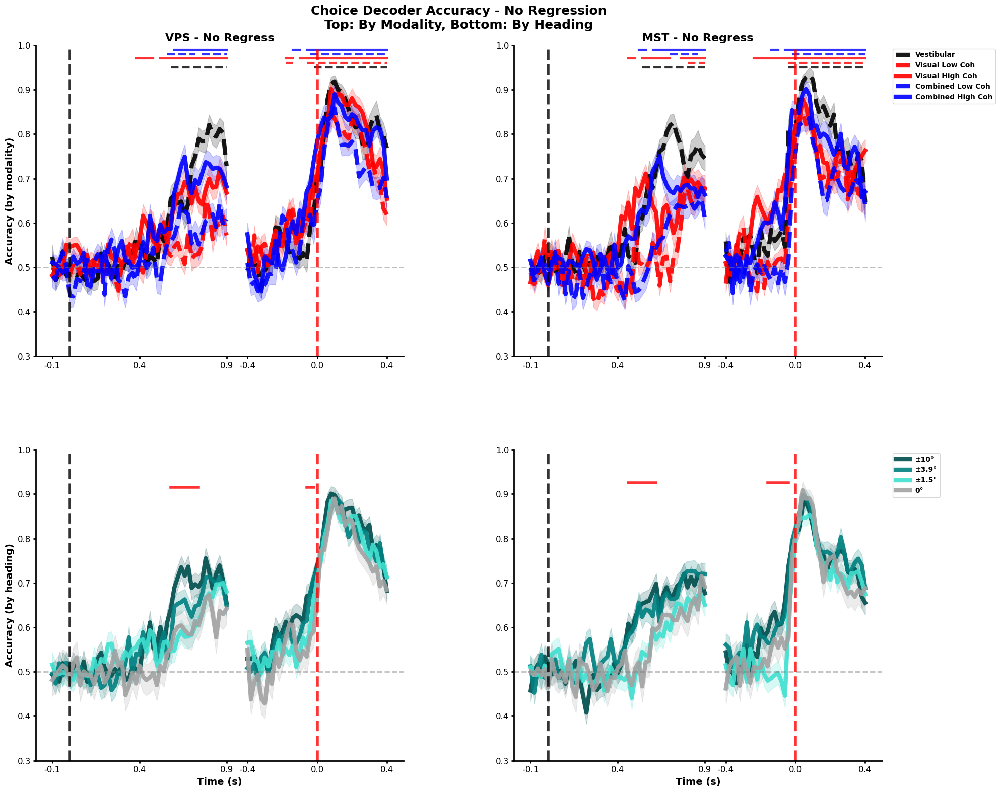


FIGURE GENERATED WITH 4 SUBPLOTS!
1. VPS no regress choice decoder accuracy (by modality) - Top Left
2. MST no regress choice decoder accuracy (by modality) - Top Right
3. VPS no regress choice decoder accuracy (by heading) - Bottom Left
4. MST no regress choice decoder accuracy (by heading) - Bottom Right


In [4]:
import numpy as np
from scipy import stats
from scipy.stats import f_oneway
import matplotlib.pyplot as plt

# Define heading groups with colors
heading_groups = {
    '±10°': ([1, 7], "#004D4D"),   # Very dark teal
    '±3.9°': ([2, 6], "#008080"),   # Medium teal
    '±1.5°': ([3, 5], "#40E0D0"),   # Light turquoise
    '0°': ([4], "#A2A2A2")          # Keep gray for center/0°
}   

# Define modality/coherence combinations with their styles
modality_styles = [
    {'name': 'Vestibular', 'mod': 1, 'coh': 1, 'color': 'black', 'linestyle': '--'},
    {'name': 'Visual Low Coh', 'mod': 2, 'coh': 1, 'color': 'red', 'linestyle': '--'},
    {'name': 'Visual High Coh', 'mod': 2, 'coh': 2, 'color': 'red', 'linestyle': '-'},
    {'name': 'Combined Low Coh', 'mod': 3, 'coh': 1, 'color': 'blue', 'linestyle': '--'},
    {'name': 'Combined High Coh', 'mod': 3, 'coh': 2, 'color': 'blue', 'linestyle': '-'}
]

# Fixed parameters for the four subplots we want
target = 'choice'
areas = ['VPS', 'MST']
regression_method = 'decoders_noregress'
selected_alignments = ['stimOn', 'saccOnset']

# Create a 2x2 figure for the four subplots
fig, axes = plt.subplots(2, 2, figsize=(20, 16))

# Get time axes for both alignments
stimon_time_axis = time_axes_dots3DMP['stimOn']
saccade_time_axis = time_axes_dots3DMP['saccOnset']

# For saccOnset, only use from -400ms to end
saccade_start_idx = np.where(saccade_time_axis >= -0.4)[0][0]
saccade_time_axis_trimmed = saccade_time_axis[saccade_start_idx:]

# Create combined x-axis positions (indices) and labels
stimon_indices = np.arange(len(stimon_time_axis))
gap_size = 5
saccade_indices = np.arange(len(saccade_time_axis_trimmed)) + len(stimon_time_axis) + gap_size

combined_indices = np.concatenate([stimon_indices, saccade_indices])
combined_time_labels = np.concatenate([stimon_time_axis, saccade_time_axis_trimmed])

# Process each area
for area_idx, area in enumerate(areas):
    print(f"\nProcessing {area}...")
    
    # Row 0: By modality (all headings pooled)
    # Row 1: By heading (all modalities pooled)
    
    # First, process by modality (row 0)
    ax_modality = axes[0, area_idx]
    
    # Store modality data for statistics
    modality_data = {}
    
    # Plot each modality/coherence combination
    for mod_config in modality_styles:
        print(f"  Processing {mod_config['name']}...")
        
        mod = mod_config['mod']
        coh = mod_config['coh']
        color = mod_config['color']
        linestyle = mod_config['linestyle']
        
        # Initialize storage for this modality
        modality_data[mod_config['name']] = {
            'stimon_acc': {t: [] for t in range(len(stimon_time_axis))},
            'saccade_acc': {t: [] for t in range(len(saccade_time_axis_trimmed))},
            'stimon_perm_sig': {t: False for t in range(len(stimon_time_axis))},
            'saccade_perm_sig': {t: False for t in range(len(saccade_time_axis_trimmed))}
        }
        
        # Collect data for this modality/coherence (all headings)
        stimon_acc_by_time = {t: [] for t in range(len(stimon_time_axis))}
        saccade_acc_by_time = {t: [] for t in range(len(saccade_time_axis_trimmed))}
        
        # For permutation test significance
        stimon_perm_pvals = {t: [] for t in range(len(stimon_time_axis))}
        saccade_perm_pvals = {t: [] for t in range(len(saccade_time_axis_trimmed))}
        
        for alignment in selected_alignments:
            time_axis = stimon_time_axis if alignment == 'stimOn' else saccade_time_axis_trimmed
            
            # Collect all trials
            all_trials = []
            for date in dates:
                filepath = get_filepath(date, area, alignment, target, mod, coh, regression=regression_method)
                try:
                    results = np.load(filepath, allow_pickle=True).item()
                    all_trials.extend(results['trial_results'])
                except:
                    continue
            
            # Process all trials
            for trial in all_trials:
                if 'y_test' in trial and 'y_pred' in trial:
                    trial_correct = []
                    
                    for y_t, y_pred in zip(trial['y_test'], trial['y_pred']):
                        trial_correct.append(1 if y_pred == y_t else 0)
                    
                    # Get permutation test p-value
                    p_value = None
                    if 'permutation_test' in trial and 'All' in trial['permutation_test']:
                        p_value = trial['permutation_test']['All']['p_value_accuracy']
                    
                    if trial_correct:
                        time_idx = trial['time']
                        if alignment == 'saccOnset':
                            time_idx = time_idx - saccade_start_idx
                        
                        if 0 <= time_idx < len(time_axis):
                            if alignment == 'stimOn':
                                stimon_acc_by_time[time_idx].append(np.mean(trial_correct))
                                modality_data[mod_config['name']]['stimon_acc'][time_idx].append(np.mean(trial_correct))
                                if p_value is not None:
                                    stimon_perm_pvals[time_idx].append(p_value)
                            else:
                                saccade_acc_by_time[time_idx].append(np.mean(trial_correct))
                                modality_data[mod_config['name']]['saccade_acc'][time_idx].append(np.mean(trial_correct))
                                if p_value is not None:
                                    saccade_perm_pvals[time_idx].append(p_value)
        
        # Calculate baseline correction
        baseline_acc = 0.5
        baseline_acc_vals = []
        for t in range(len(stimon_time_axis)):
            if stimon_time_axis[t] < 0 and stimon_acc_by_time[t]:
                baseline_acc_vals.extend(stimon_acc_by_time[t])
        
        if baseline_acc_vals:
            baseline_acc = np.mean(baseline_acc_vals)
        
        # Determine permutation test significance
        for t in range(len(stimon_time_axis)):
            if stimon_perm_pvals[t] and len(stimon_perm_pvals[t]) > 0:
                sig_count = sum(p < 0.05 for p in stimon_perm_pvals[t])
                modality_data[mod_config['name']]['stimon_perm_sig'][t] = sig_count / len(stimon_perm_pvals[t]) > 0.1
        
        for t in range(len(saccade_time_axis_trimmed)):
            if saccade_perm_pvals[t] and len(saccade_perm_pvals[t]) > 0:
                sig_count = sum(p < 0.05 for p in saccade_perm_pvals[t])
                modality_data[mod_config['name']]['saccade_perm_sig'][t] = sig_count / len(saccade_perm_pvals[t]) > 0.1
        
        # Calculate means and SEMs
        stimon_times = []
        stimon_acc_means = []
        stimon_acc_sems = []
        
        for t in range(len(stimon_time_axis)):
            if stimon_acc_by_time[t]:
                stimon_times.append(stimon_indices[t])
                stimon_acc_means.append(np.mean(stimon_acc_by_time[t]) - baseline_acc + 0.5)
                stimon_acc_sems.append(stats.sem(stimon_acc_by_time[t]))
        
        saccade_times = []
        saccade_acc_means = []
        saccade_acc_sems = []
        
        for t in range(len(saccade_time_axis_trimmed)):
            if saccade_acc_by_time[t]:
                saccade_times.append(saccade_indices[t])
                saccade_acc_means.append(np.mean(saccade_acc_by_time[t]) - baseline_acc + 0.5)
                saccade_acc_sems.append(stats.sem(saccade_acc_by_time[t]))
        
        # Plot with modality-specific color and linestyle
        if stimon_times:
            ax_modality.plot(stimon_times, stimon_acc_means, 
                           color=color, linestyle=linestyle, linewidth=6, 
                           label=mod_config['name'], alpha=0.9)
            ax_modality.fill_between(stimon_times,
                                   np.array(stimon_acc_means) - np.array(stimon_acc_sems),
                                   np.array(stimon_acc_means) + np.array(stimon_acc_sems),
                                   color=color, alpha=0.2)
        
        if saccade_times:
            ax_modality.plot(saccade_times, saccade_acc_means, 
                           color=color, linestyle=linestyle, linewidth=6, alpha=0.9)
            ax_modality.fill_between(saccade_times,
                                   np.array(saccade_acc_means) - np.array(saccade_acc_sems),
                                   np.array(saccade_acc_means) + np.array(saccade_acc_sems),
                                   color=color, alpha=0.2)
    
    # Add significance lines for modalities
    y_min, y_max = ax_modality.get_ylim()
    line_spacing = 0.01
    base_y = 0.95
    
    for mod_idx, (mod_name, mod_data) in enumerate(modality_data.items()):
        mod_config = next(m for m in modality_styles if m['name'] == mod_name)
        
        sig_times = []
        for t in range(len(stimon_time_axis)):
            if mod_data['stimon_perm_sig'][t]:
                sig_times.append(stimon_indices[t])
        for t in range(len(saccade_time_axis_trimmed)):
            if mod_data['saccade_perm_sig'][t]:
                sig_times.append(saccade_indices[t])
        
        if sig_times:
            line_y = base_y + mod_idx * line_spacing
            
            # Group consecutive time points
            sig_groups = []
            current_group = [sig_times[0]]
            
            for i in range(1, len(sig_times)):
                if sig_times[i] - sig_times[i-1] == 1:
                    current_group.append(sig_times[i])
                else:
                    if len(current_group) > 2:
                        sig_groups.append(current_group)
                    current_group = [sig_times[i]]
            if len(current_group) > 2:
                sig_groups.append(current_group)
            
            for group in sig_groups:
                ax_modality.plot([group[0], group[-1]], [line_y, line_y], 
                               color=mod_config['color'], 
                               linestyle=mod_config['linestyle'], 
                               linewidth=3, alpha=0.8)
    
    # Now process by heading (row 1)
    ax_heading = axes[1, area_idx]
    
    # Store heading data for statistics
    heading_data = {}
    all_heading_plot_data = {}
    
    # Process each heading group
    for group_name, (heading_indices, heading_color) in heading_groups.items():
        print(f"  Processing {group_name} (all modalities pooled)...")
        
        # Initialize storage
        heading_data[group_name] = {
            'stimon_acc': {t: [] for t in range(len(stimon_time_axis))},
            'saccade_acc': {t: [] for t in range(len(saccade_time_axis_trimmed))}
        }
        
        # Collect data from all modalities
        stimon_acc_by_time = {t: [] for t in range(len(stimon_time_axis))}
        saccade_acc_by_time = {t: [] for t in range(len(saccade_time_axis_trimmed))}
        
        for mod_config in modality_styles:
            mod = mod_config['mod']
            coh = mod_config['coh']
            
            for alignment in selected_alignments:
                time_axis = stimon_time_axis if alignment == 'stimOn' else saccade_time_axis_trimmed
                
                all_trials = []
                for date in dates:
                    filepath = get_filepath(date, area, alignment, target, mod, coh, regression=regression_method)
                    try:
                        results = np.load(filepath, allow_pickle=True).item()
                        all_trials.extend(results['trial_results'])
                    except:
                        continue
                
                for trial in all_trials:
                    if 'test_behavior' in trial and 'headingInd' in trial['test_behavior']:
                        test_heading_indices = trial['test_behavior']['headingInd']
                        heading_mask = np.isin(test_heading_indices, heading_indices)
                        
                        if not np.any(heading_mask):
                            continue
                        
                        y_test_filtered = np.array(trial['y_test'])[heading_mask]
                        y_pred_filtered = np.array(trial['y_pred'])[heading_mask]
                        
                        trial_correct = []
                        for y_t, y_pred in zip(y_test_filtered, y_pred_filtered):
                            trial_correct.append(1 if y_pred == y_t else 0) 
                        if trial_correct:
                            time_idx = trial['time']
                            if alignment == 'saccOnset':
                                time_idx = time_idx - saccade_start_idx
                            
                            if 0 <= time_idx < len(time_axis):
                                if alignment == 'stimOn':
                                    stimon_acc_by_time[time_idx].append(np.mean(trial_correct))
                                    heading_data[group_name]['stimon_acc'][time_idx].append(np.mean(trial_correct))
                                else:
                                    saccade_acc_by_time[time_idx].append(np.mean(trial_correct))
                                    heading_data[group_name]['saccade_acc'][time_idx].append(np.mean(trial_correct))
        
        # Calculate baseline correction
        baseline_acc = 0.5
        baseline_acc_vals = []
        for t in range(len(stimon_time_axis)):
            if stimon_time_axis[t] < 0 and stimon_acc_by_time[t]:
                baseline_acc_vals.extend(stimon_acc_by_time[t])
        
        if baseline_acc_vals:
            baseline_acc = np.mean(baseline_acc_vals)
        
        # Store plot data
        all_heading_plot_data[group_name] = {
            'color': heading_color,
            'baseline_acc': baseline_acc,
            'stimon_acc_by_time': stimon_acc_by_time,
            'saccade_acc_by_time': saccade_acc_by_time
        }
    
    # Plot all headings
    for group_name, plot_data in all_heading_plot_data.items():
        # Calculate means and SEMs
        stimon_times = []
        stimon_acc_means = []
        stimon_acc_sems = []
        
        for t in range(len(stimon_time_axis)):
            if plot_data['stimon_acc_by_time'][t]:
                stimon_times.append(stimon_indices[t])
                stimon_acc_means.append(np.mean(plot_data['stimon_acc_by_time'][t]) - plot_data['baseline_acc'] + 0.5)
                stimon_acc_sems.append(stats.sem(plot_data['stimon_acc_by_time'][t]))
        
        saccade_times = []
        saccade_acc_means = []
        saccade_acc_sems = []
        
        for t in range(len(saccade_time_axis_trimmed)):
            if plot_data['saccade_acc_by_time'][t]:
                saccade_times.append(saccade_indices[t])
                saccade_acc_means.append(np.mean(plot_data['saccade_acc_by_time'][t]) - plot_data['baseline_acc'] + 0.5)
                saccade_acc_sems.append(stats.sem(plot_data['saccade_acc_by_time'][t]))
        
        # Plot with SEM shading
        if stimon_times:
            ax_heading.plot(stimon_times, stimon_acc_means, 
                          color=plot_data['color'], linestyle='-', linewidth=6, 
                          label=group_name, alpha=0.9)
            ax_heading.fill_between(stimon_times,
                                  np.array(stimon_acc_means) - np.array(stimon_acc_sems),
                                  np.array(stimon_acc_means) + np.array(stimon_acc_sems),
                                  color=plot_data['color'], alpha=0.2)
        
        if saccade_times:
            ax_heading.plot(saccade_times, saccade_acc_means, 
                          color=plot_data['color'], linestyle='-', linewidth=6, alpha=0.9)
            ax_heading.fill_between(saccade_times,
                                  np.array(saccade_acc_means) - np.array(saccade_acc_sems),
                                  np.array(saccade_acc_means) + np.array(saccade_acc_sems),
                                  color=plot_data['color'], alpha=0.2)
    
    # Add correlation analysis for heading comparisons
    y_min, y_max = ax_heading.get_ylim()
    line_y = y_max - 0.05 * (y_max - y_min)
    
    # Define heading values for correlation
    heading_order = ['0°', '±1.5°', '±3.9°', '±10°']
    heading_values = [0, 1.5, 3.9, 10]
    
    # Perform correlation at each time point
    corr_sig_times_pos = []
    corr_sig_times_neg = []
    
    for t in range(len(stimon_time_axis)):
        if stimon_time_axis[t] >= 0:  # Only after stimulus onset
            all_headings = []
            all_values = []
            
            for i, group_name in enumerate(heading_order):
                if group_name in heading_data:
                    group_values = heading_data[group_name]['stimon_acc'][t]
                    if group_values:
                        all_headings.extend([heading_values[i]] * len(group_values))
                        all_values.extend(group_values)
            
            if len(all_headings) >= 20:
                r, p_val = stats.pearsonr(all_headings, all_values)
                if p_val < 0.05:
                    if r > 0:
                        corr_sig_times_pos.append(stimon_indices[t])
                    else:
                        corr_sig_times_neg.append(stimon_indices[t])
    
    # Perform correlation for saccade alignment
    corr_sig_times_pos_saccade = []
    corr_sig_times_neg_saccade = []
    
    for t in range(len(saccade_time_axis_trimmed)):
        all_headings = []
        all_values = []
        
        for i, group_name in enumerate(heading_order):
            if group_name in heading_data:
                group_values = heading_data[group_name]['saccade_acc'][t]
                if group_values:
                    all_headings.extend([heading_values[i]] * len(group_values))
                    all_values.extend(group_values)
        
        if len(all_headings) >= 20:
            r, p_val = stats.pearsonr(all_headings, all_values)
            if p_val < 0.05:
                if r > 0:
                    corr_sig_times_pos_saccade.append(saccade_indices[t])
                else:
                    corr_sig_times_neg_saccade.append(saccade_indices[t])
    
    # Combine and plot significance lines
    all_corr_sig_times_pos = corr_sig_times_pos + corr_sig_times_pos_saccade
    all_corr_sig_times_neg = corr_sig_times_neg + corr_sig_times_neg_saccade
    
    # Plot positive correlations (red, solid)
    if all_corr_sig_times_pos:
        sig_groups = []
        current_group = [all_corr_sig_times_pos[0]]
        
        for i in range(1, len(all_corr_sig_times_pos)):
            if all_corr_sig_times_pos[i] - all_corr_sig_times_pos[i-1] == 1:
                current_group.append(all_corr_sig_times_pos[i])
            else:
                if len(current_group) > 2:
                    sig_groups.append(current_group)
                current_group = [all_corr_sig_times_pos[i]]
        if len(current_group) > 2:
            sig_groups.append(current_group)
        
        for group in sig_groups:
            ax_heading.plot([group[0], group[-1]], [line_y, line_y], 
                          color='red', linestyle='-', linewidth=4, alpha=0.8)
    
    # Plot negative correlations (blue, dashed)
    if all_corr_sig_times_neg:
        sig_groups = []
        current_group = [all_corr_sig_times_neg[0]]
        
        for i in range(1, len(all_corr_sig_times_neg)):
            if all_corr_sig_times_neg[i] - all_corr_sig_times_neg[i-1] == 1:
                current_group.append(all_corr_sig_times_neg[i])
            else:
                if len(current_group) > 2:
                    sig_groups.append(current_group)
                current_group = [all_corr_sig_times_neg[i]]
        if len(current_group) > 2:
            sig_groups.append(current_group)
        
        for group in sig_groups:
            ax_heading.plot([group[0], group[-1]], [line_y - 0.02 * (y_max - y_min), line_y - 0.02 * (y_max - y_min)], 
                          color='blue', linestyle='--', linewidth=3, alpha=0.8)
    
    # Format both subplots for this area
    for row_idx, ax in enumerate([ax_modality, ax_heading]):
        # Remove top and right spines
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        
        # Add reference line
        ax.axhline(y=0.5, color='gray', linestyle='--', alpha=0.5, linewidth=2)
        
        # Add event alignment markers
        stimon_zero_idx = np.where(stimon_time_axis >= 0)[0][0]
        saccade_zero_idx = saccade_indices[0] + np.where(saccade_time_axis_trimmed >= 0)[0][0]
        
        ax.axvline(x=stimon_zero_idx, color='black', linestyle='--', alpha=0.8, linewidth=4)
        ax.axvline(x=saccade_zero_idx, color='red', linestyle='--', alpha=0.8, linewidth=4)
        
        # Set custom x-axis ticks and labels
        stimon_ticks = [0, len(stimon_time_axis)//2, len(stimon_time_axis)-1]
        saccade_ticks = [saccade_indices[0], 
                        saccade_indices[len(saccade_indices)//2], 
                        saccade_indices[-1]]

        tick_indices = stimon_ticks + saccade_ticks

        stimon_tick_labels = [f'{stimon_time_axis[t]:.1f}' for t in stimon_ticks]
        saccade_tick_labels = [f'{saccade_time_axis_trimmed[0]:.1f}',
                            f'{saccade_time_axis_trimmed[len(saccade_time_axis_trimmed)//2]:.1f}',
                            f'{saccade_time_axis_trimmed[-1]:.1f}']

        tick_labels = stimon_tick_labels + saccade_tick_labels

        ax.set_xticks(tick_indices)
        ax.set_xticklabels(tick_labels)
        
        # Set labels
        if row_idx == 1:  # Bottom row
            ax.set_xlabel('Time (s)', fontsize=14, fontweight='bold')
        
        if area_idx == 0:  # Left column
            if row_idx == 0:
                ax.set_ylabel('Accuracy (by modality)', fontsize=14, fontweight='bold')
            else:
                ax.set_ylabel('Accuracy (by heading)', fontsize=14, fontweight='bold')
        
        # Set title for top row
        if row_idx == 0:
            ax.set_title(f'{area} - No Regress', fontsize=16, fontweight='bold')
        
        # Set y-limits
        ax.set_ylim(0.3, 1.0)
        
        # Add legend
        if area_idx == 1:  # Right column
            ax.legend(fontsize=12, prop={'weight': 'bold'}, loc='upper left', bbox_to_anchor=(1.02, 1))
        
        # Make remaining spines thicker
        ax.spines['left'].set_linewidth(2)
        ax.spines['bottom'].set_linewidth(2)
        ax.tick_params(width=2, labelsize=12)

# Add overall title
fig.suptitle('Choice Decoder Accuracy - No Regression\nTop: By Modality, Bottom: By Heading', 
             fontsize=18, fontweight='bold', y=0.98)

plt.tight_layout()
plt.subplots_adjust(top=0.93, left=0.08, right=0.92, hspace=0.3, wspace=0.3)

# Save figure
save_filename = "D:\\Neural-Pipeline\\results\\analysis_population\\choice_decoder_accuracy_4subplots.png"
plt.savefig(save_filename, dpi=300, bbox_inches='tight')
print(f"\nFigure saved as: {save_filename}")

plt.show()

print("\n" + "="*80)
print("FIGURE GENERATED WITH 4 SUBPLOTS!")
print("="*80)
print("1. VPS no regress choice decoder accuracy (by modality) - Top Left")
print("2. MST no regress choice decoder accuracy (by modality) - Top Right")
print("3. VPS no regress choice decoder accuracy (by heading) - Bottom Left")
print("4. MST no regress choice decoder accuracy (by heading) - Bottom Right")

### choice / stimlus by mod + heading + correctness + pdw


PROCESSING CHOICE DECODER


PROCESSING AREA: VPS
[ROW 0: BY MODALITY]
[ROW 1: BY HEADING]
[ROW 2: CORRECT vs ERROR]
[ROW 3: HIGH vs LOW PDW]

PROCESSING AREA: MST
[ROW 0: BY MODALITY]
[ROW 1: BY HEADING]
[ROW 2: CORRECT vs ERROR]
[ROW 3: HIGH vs LOW PDW]

Figure saved as: D:\Neural-Pipeline\results\analysis_population\choice_decoder_accuracy.png


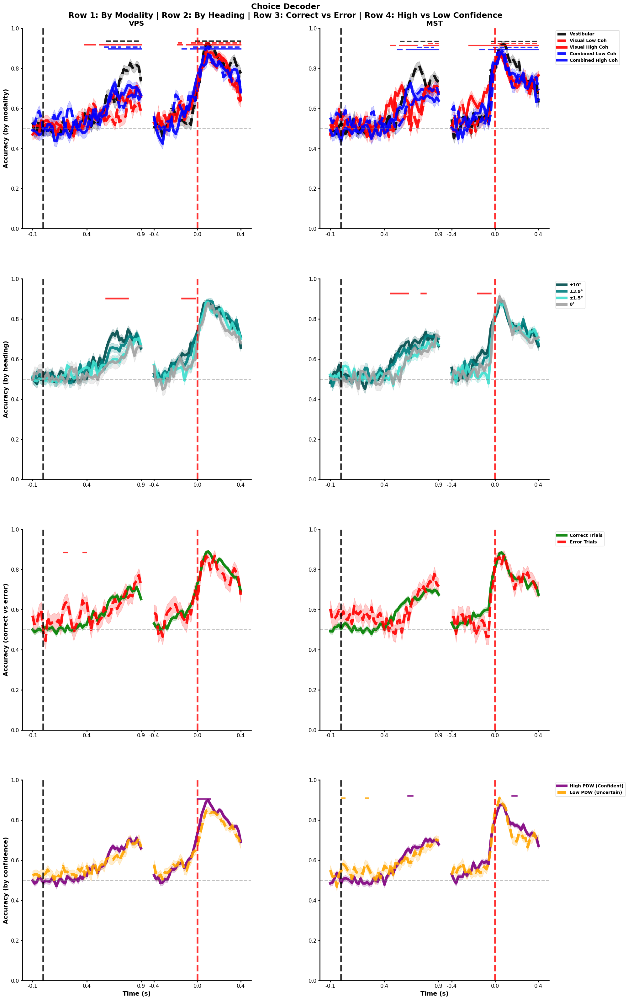


PROCESSING STIMULUS DECODER
Note: Excluding 0° heading for stimulus decoder


PROCESSING AREA: VPS
[ROW 0: BY MODALITY]
[ROW 1: BY HEADING]
[ROW 2: CORRECT vs ERROR]
[ROW 3: HIGH vs LOW PDW]

PROCESSING AREA: MST
[ROW 0: BY MODALITY]
[ROW 1: BY HEADING]
[ROW 2: CORRECT vs ERROR]
[ROW 3: HIGH vs LOW PDW]

Figure saved as: D:\Neural-Pipeline\results\analysis_population\stimulus_decoder_accuracy.png


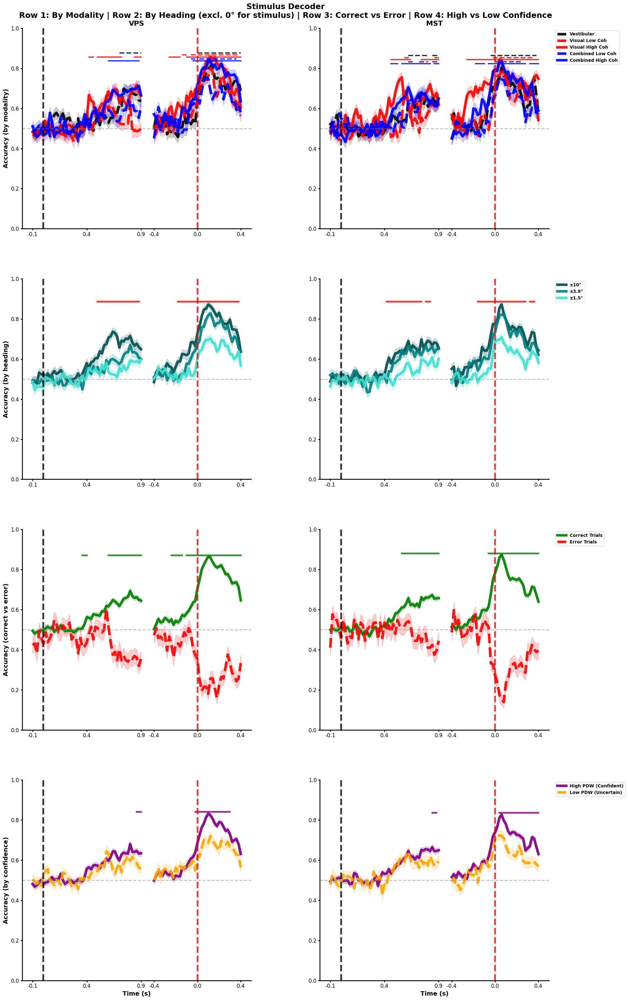


ANALYSIS COMPLETE


In [16]:
import numpy as np
from scipy import stats
from scipy.stats import f_oneway
import matplotlib.pyplot as plt

# Define heading groups with colors
heading_groups = {
    '±10°': ([1, 7], "#004D4D"),   # Very dark teal
    '±3.9°': ([2, 6], "#008080"),   # Medium teal
    '±1.5°': ([3, 5], "#40E0D0"),   # Light turquoise
    '0°': ([4], "#A2A2A2")          # Keep gray for center/0°
}   

# Define modality/coherence combinations with their styles
modality_styles = [
    {'name': 'Vestibular', 'mod': 1, 'coh': 1, 'color': 'black', 'linestyle': '--'},
    {'name': 'Visual Low Coh', 'mod': 2, 'coh': 1, 'color': 'red', 'linestyle': '--'},
    {'name': 'Visual High Coh', 'mod': 2, 'coh': 2, 'color': 'red', 'linestyle': '-'},
    {'name': 'Combined Low Coh', 'mod': 3, 'coh': 1, 'color': 'blue', 'linestyle': '--'},
    {'name': 'Combined High Coh', 'mod': 3, 'coh': 2, 'color': 'blue', 'linestyle': '-'}
]

# Fixed parameters
areas = ['VPS', 'MST']
regression_method = 'decoders_noregress'
selected_alignments = ['stimOn', 'saccOnset']

# Loop through both targets: choice and stimulus
for target in ['choice', 'stimulus']:
    print(f"\n{'='*80}")
    print(f"PROCESSING {target.upper()} DECODER")
    if target == 'stimulus':
        print("Note: Excluding 0° heading for stimulus decoder")
    print(f"{'='*80}\n")
    
    # Define which headings to exclude based on target
    non_zero_heading_indices = [1, 2, 3, 5, 6, 7]  # All non-zero headings
    
    # Create a 4x2 figure (4 rows, 2 columns)
    fig, axes = plt.subplots(4, 2, figsize=(20, 32))
    
    # Get time axes for both alignments
    stimon_time_axis = time_axes_dots3DMP['stimOn']
    saccade_time_axis = time_axes_dots3DMP['saccOnset']
    
    # For saccOnset, only use from -400ms to end
    saccade_start_idx = np.where(saccade_time_axis >= -0.4)[0][0]
    saccade_time_axis_trimmed = saccade_time_axis[saccade_start_idx:]
    
    # Create combined x-axis positions (indices) and labels
    stimon_indices = np.arange(len(stimon_time_axis))
    gap_size = 5
    saccade_indices = np.arange(len(saccade_time_axis_trimmed)) + len(stimon_time_axis) + gap_size
    
    combined_indices = np.concatenate([stimon_indices, saccade_indices])
    combined_time_labels = np.concatenate([stimon_time_axis, saccade_time_axis_trimmed])
    
    # Define baseline period
    baseline_indices = [t for t in range(len(stimon_time_axis)) if -0.5 <= stimon_time_axis[t] < 0]
    
    # Process each area
    for area_idx, area in enumerate(areas):
        print(f"\nPROCESSING AREA: {area}")
        
        # ============================================================
        # ROW 0: BY MODALITY (all headings pooled, exclude 0° for stimulus)
        # ============================================================
        ax_modality = axes[0, area_idx]
        
        print(f"[ROW 0: BY MODALITY]")
        
        # Store modality data for statistics
        modality_data = {}
        
        # Plot each modality/coherence combination
        for mod_config in modality_styles:
            mod = mod_config['mod']
            coh = mod_config['coh']
            color = mod_config['color']
            linestyle = mod_config['linestyle']
            
            # Initialize storage for this modality
            modality_data[mod_config['name']] = {
                'stimon_acc': {t: [] for t in range(len(stimon_time_axis))},
                'saccade_acc': {t: [] for t in range(len(saccade_time_axis_trimmed))},
                'stimon_perm_sig': {t: False for t in range(len(stimon_time_axis))},
                'saccade_perm_sig': {t: False for t in range(len(saccade_time_axis_trimmed))}
            }
            
            # Collect data for this modality/coherence
            stimon_acc_by_time = {t: [] for t in range(len(stimon_time_axis))}
            saccade_acc_by_time = {t: [] for t in range(len(saccade_time_axis_trimmed))}
            
            # For permutation test significance
            stimon_perm_pvals = {t: [] for t in range(len(stimon_time_axis))}
            saccade_perm_pvals = {t: [] for t in range(len(saccade_time_axis_trimmed))}
            
            for alignment in selected_alignments:
                time_axis = stimon_time_axis if alignment == 'stimOn' else saccade_time_axis_trimmed
                
                # Collect all trials
                all_trials = []
                for date in dates:
                    filepath = get_filepath(date, area, alignment, target, mod, coh, regression=regression_method)
                    try:
                        results = np.load(filepath, allow_pickle=True).item()
                        all_trials.extend(results['trial_results'])
                    except:
                        continue
                
                # Process all trials
                for trial in all_trials:
                    if 'y_test' in trial and 'y_pred' in trial:
                        # For stimulus decoder, filter out zero heading trials
                        if target == 'stimulus' and 'test_behavior' in trial and 'headingInd' in trial['test_behavior']:
                            test_heading_indices = trial['test_behavior']['headingInd']
                            non_zero_mask = np.isin(test_heading_indices, non_zero_heading_indices)
                            
                            if not np.any(non_zero_mask):
                                continue
                            
                            y_test_filtered = np.array(trial['y_test'])[non_zero_mask]
                            y_pred_filtered = np.array(trial['y_pred'])[non_zero_mask]
                        else:
                            y_test_filtered = trial['y_test']
                            y_pred_filtered = trial['y_pred']
                        
                        time_idx = trial['time']
                        if alignment == 'saccOnset':
                            time_idx = time_idx - saccade_start_idx
                        
                        if 0 <= time_idx < len(time_axis):
                            # Store individual sample accuracies
                            for y_t, y_pred in zip(y_test_filtered, y_pred_filtered):
                                acc = 1 if y_pred == y_t else 0
                                if alignment == 'stimOn':
                                    stimon_acc_by_time[time_idx].append(acc)
                                    modality_data[mod_config['name']]['stimon_acc'][time_idx].append(acc)
                                else:
                                    saccade_acc_by_time[time_idx].append(acc)
                                    modality_data[mod_config['name']]['saccade_acc'][time_idx].append(acc)
                            
                            # Get permutation test p-value (per trial)
                            if 'permutation_test' in trial and 'All' in trial['permutation_test']:
                                p_value = trial['permutation_test']['All']['p_value_accuracy']
                                if p_value is not None:
                                    if alignment == 'stimOn':
                                        stimon_perm_pvals[time_idx].append(p_value)
                                    else:
                                        saccade_perm_pvals[time_idx].append(p_value)
            
            # Determine permutation test significance
            for t in range(len(stimon_time_axis)):
                if stimon_perm_pvals[t] and len(stimon_perm_pvals[t]) > 0:
                    sig_count = sum(p < 0.05 for p in stimon_perm_pvals[t])
                    modality_data[mod_config['name']]['stimon_perm_sig'][t] = sig_count / len(stimon_perm_pvals[t]) > 0.1
            
            for t in range(len(saccade_time_axis_trimmed)):
                if saccade_perm_pvals[t] and len(saccade_perm_pvals[t]) > 0:
                    sig_count = sum(p < 0.05 for p in saccade_perm_pvals[t])
                    modality_data[mod_config['name']]['saccade_perm_sig'][t] = sig_count / len(saccade_perm_pvals[t]) > 0.1
            
            # Calculate means and SEMs
            stimon_times = []
            stimon_acc_means = []
            stimon_acc_sems = []
            
            for t in range(len(stimon_time_axis)):
                if stimon_acc_by_time[t]:
                    stimon_times.append(stimon_indices[t])
                    stimon_acc_means.append(np.mean(stimon_acc_by_time[t]))
                    stimon_acc_sems.append(stats.sem(stimon_acc_by_time[t]))
            
            saccade_times = []
            saccade_acc_means = []
            saccade_acc_sems = []
            
            for t in range(len(saccade_time_axis_trimmed)):
                if saccade_acc_by_time[t]:
                    saccade_times.append(saccade_indices[t])
                    saccade_acc_means.append(np.mean(saccade_acc_by_time[t]))
                    saccade_acc_sems.append(stats.sem(saccade_acc_by_time[t]))
            
            # Plot with modality-specific color and linestyle
            if stimon_times:
                ax_modality.plot(stimon_times, stimon_acc_means, 
                               color=color, linestyle=linestyle, linewidth=6, 
                               label=mod_config['name'], alpha=0.9)
                ax_modality.fill_between(stimon_times,
                                       np.array(stimon_acc_means) - np.array(stimon_acc_sems),
                                       np.array(stimon_acc_means) + np.array(stimon_acc_sems),
                                       color=color, alpha=0.2)
            
            if saccade_times:
                ax_modality.plot(saccade_times, saccade_acc_means, 
                               color=color, linestyle=linestyle, linewidth=6, alpha=0.9)
                ax_modality.fill_between(saccade_times,
                                       np.array(saccade_acc_means) - np.array(saccade_acc_sems),
                                       np.array(saccade_acc_means) + np.array(saccade_acc_sems),
                                       color=color, alpha=0.2)
        
        # Add significance lines for modalities
        y_min, y_max = ax_modality.get_ylim()
        line_spacing = 0.01
        base_y = y_max - 0.05 * (y_max - y_min)
        
        for mod_idx, (mod_name, mod_data) in enumerate(modality_data.items()):
            mod_config = next(m for m in modality_styles if m['name'] == mod_name)
            
            sig_times = []
            for t in range(len(stimon_time_axis)):
                if mod_data['stimon_perm_sig'][t]:
                    sig_times.append(stimon_indices[t])
            for t in range(len(saccade_time_axis_trimmed)):
                if mod_data['saccade_perm_sig'][t]:
                    sig_times.append(saccade_indices[t])
            
            if sig_times:
                line_y = base_y - mod_idx * line_spacing
                
                sig_groups = []
                current_group = [sig_times[0]]
                
                for i in range(1, len(sig_times)):
                    if sig_times[i] - sig_times[i-1] == 1:
                        current_group.append(sig_times[i])
                    else:
                        if len(current_group) > 2:
                            sig_groups.append(current_group)
                        current_group = [sig_times[i]]
                if len(current_group) > 2:
                    sig_groups.append(current_group)
                
                for group in sig_groups:
                    ax_modality.plot([group[0], group[-1]], [line_y, line_y], 
                                   color=mod_config['color'], 
                                   linestyle=mod_config['linestyle'], 
                                   linewidth=3, alpha=0.8)
        
        # ============================================================
        # ROW 1: BY HEADING (all modalities pooled)
        # ============================================================
        ax_heading = axes[1, area_idx]
        
        print(f"[ROW 1: BY HEADING]")
        
        heading_data = {}
        all_heading_plot_data = {}
        
        # For stimulus decoder, exclude 0° heading
        if target == 'stimulus':
            heading_groups_to_plot = {k: v for k, v in heading_groups.items() if k != '0°'}
        else:
            heading_groups_to_plot = heading_groups
        
        # Process each heading group
        for group_name, (heading_indices_list, heading_color) in heading_groups_to_plot.items():
            heading_data[group_name] = {
                'stimon_acc': {t: [] for t in range(len(stimon_time_axis))},
                'saccade_acc': {t: [] for t in range(len(saccade_time_axis_trimmed))}
            }
            
            stimon_acc_by_time = {t: [] for t in range(len(stimon_time_axis))}
            saccade_acc_by_time = {t: [] for t in range(len(saccade_time_axis_trimmed))}
            
            for mod_config in modality_styles:
                mod = mod_config['mod']
                coh = mod_config['coh']
                
                for alignment in selected_alignments:
                    time_axis = stimon_time_axis if alignment == 'stimOn' else saccade_time_axis_trimmed
                    
                    all_trials = []
                    for date in dates:
                        filepath = get_filepath(date, area, alignment, target, mod, coh, regression=regression_method)
                        try:
                            results = np.load(filepath, allow_pickle=True).item()
                            all_trials.extend(results['trial_results'])
                        except:
                            continue
                    
                    for trial in all_trials:
                        if 'test_behavior' in trial and 'headingInd' in trial['test_behavior']:
                            test_heading_indices = trial['test_behavior']['headingInd']
                            heading_mask = np.isin(test_heading_indices, heading_indices_list)
                            
                            if not np.any(heading_mask):
                                continue
                            
                            y_test_filtered = np.array(trial['y_test'])[heading_mask]
                            y_pred_filtered = np.array(trial['y_pred'])[heading_mask]
                            
                            time_idx = trial['time']
                            if alignment == 'saccOnset':
                                time_idx = time_idx - saccade_start_idx
                            
                            if 0 <= time_idx < len(time_axis):
                                # Store individual sample accuracies
                                for y_t, y_pred in zip(y_test_filtered, y_pred_filtered):
                                    acc = 1 if y_pred == y_t else 0
                                    if alignment == 'stimOn':
                                        stimon_acc_by_time[time_idx].append(acc)
                                        heading_data[group_name]['stimon_acc'][time_idx].append(acc)
                                    else:
                                        saccade_acc_by_time[time_idx].append(acc)
                                        heading_data[group_name]['saccade_acc'][time_idx].append(acc)
            
            all_heading_plot_data[group_name] = {
                'color': heading_color,
                'stimon_acc_by_time': stimon_acc_by_time,
                'saccade_acc_by_time': saccade_acc_by_time
            }
        
        # Plot all headings
        for group_name, plot_data in all_heading_plot_data.items():
            stimon_times = []
            stimon_acc_means = []
            stimon_acc_sems = []
            
            for t in range(len(stimon_time_axis)):
                if plot_data['stimon_acc_by_time'][t]:
                    stimon_times.append(stimon_indices[t])
                    stimon_acc_means.append(np.mean(plot_data['stimon_acc_by_time'][t]))
                    stimon_acc_sems.append(stats.sem(plot_data['stimon_acc_by_time'][t]))
            
            saccade_times = []
            saccade_acc_means = []
            saccade_acc_sems = []
            
            for t in range(len(saccade_time_axis_trimmed)):
                if plot_data['saccade_acc_by_time'][t]:
                    saccade_times.append(saccade_indices[t])
                    saccade_acc_means.append(np.mean(plot_data['saccade_acc_by_time'][t]))
                    saccade_acc_sems.append(stats.sem(plot_data['saccade_acc_by_time'][t]))
            
            if stimon_times:
                ax_heading.plot(stimon_times, stimon_acc_means, 
                              color=plot_data['color'], linestyle='-', linewidth=6, 
                              label=group_name, alpha=0.9)
                ax_heading.fill_between(stimon_times,
                                      np.array(stimon_acc_means) - np.array(stimon_acc_sems),
                                      np.array(stimon_acc_means) + np.array(stimon_acc_sems),
                                      color=plot_data['color'], alpha=0.2)
            
            if saccade_times:
                ax_heading.plot(saccade_times, saccade_acc_means, 
                              color=plot_data['color'], linestyle='-', linewidth=6, alpha=0.9)
                ax_heading.fill_between(saccade_times,
                                      np.array(saccade_acc_means) - np.array(saccade_acc_sems),
                                      np.array(saccade_acc_means) + np.array(saccade_acc_sems),
                                      color=plot_data['color'], alpha=0.2)
        
        # Add correlation analysis
        y_min, y_max = ax_heading.get_ylim()
        line_y = y_max - 0.05 * (y_max - y_min)
        
        if target == 'stimulus':
            heading_order = ['±1.5°', '±3.9°', '±10°']
            heading_values = [1.5, 3.9, 10]
        else:
            heading_order = ['0°', '±1.5°', '±3.9°', '±10°']
            heading_values = [0, 1.5, 3.9, 10]
        
        corr_sig_times_pos = []
        corr_sig_times_neg = []
        
        for t in range(len(stimon_time_axis)):
            if stimon_time_axis[t] >= 0:
                all_headings = []
                all_values = []
                
                for i, group_name in enumerate(heading_order):
                    if group_name in heading_data:
                        group_values = heading_data[group_name]['stimon_acc'][t]
                        if group_values:
                            all_headings.extend([heading_values[i]] * len(group_values))
                            all_values.extend(group_values)
                
                if len(all_headings) >= 20:
                    r, p_val = stats.pearsonr(all_headings, all_values)
                    if p_val < 0.05:
                        if r > 0:
                            corr_sig_times_pos.append(stimon_indices[t])
                        else:
                            corr_sig_times_neg.append(stimon_indices[t])
        
        corr_sig_times_pos_saccade = []
        corr_sig_times_neg_saccade = []
        
        for t in range(len(saccade_time_axis_trimmed)):
            all_headings = []
            all_values = []
            
            for i, group_name in enumerate(heading_order):
                if group_name in heading_data:
                    group_values = heading_data[group_name]['saccade_acc'][t]
                    if group_values:
                        all_headings.extend([heading_values[i]] * len(group_values))
                        all_values.extend(group_values)
            
            if len(all_headings) >= 20:
                r, p_val = stats.pearsonr(all_headings, all_values)
                if p_val < 0.05:
                    if r > 0:
                        corr_sig_times_pos_saccade.append(saccade_indices[t])
                    else:
                        corr_sig_times_neg_saccade.append(saccade_indices[t])
        
        all_corr_sig_times_pos = corr_sig_times_pos + corr_sig_times_pos_saccade
        all_corr_sig_times_neg = corr_sig_times_neg + corr_sig_times_neg_saccade
        
        if all_corr_sig_times_pos:
            sig_groups = []
            current_group = [all_corr_sig_times_pos[0]]
            
            for i in range(1, len(all_corr_sig_times_pos)):
                if all_corr_sig_times_pos[i] - all_corr_sig_times_pos[i-1] == 1:
                    current_group.append(all_corr_sig_times_pos[i])
                else:
                    if len(current_group) > 2:
                        sig_groups.append(current_group)
                    current_group = [all_corr_sig_times_pos[i]]
            if len(current_group) > 2:
                sig_groups.append(current_group)
            
            for group in sig_groups:
                ax_heading.plot([group[0], group[-1]], [line_y, line_y], 
                              color='red', linestyle='-', linewidth=4, alpha=0.8)
        
        if all_corr_sig_times_neg:
            sig_groups = []
            current_group = [all_corr_sig_times_neg[0]]
            
            for i in range(1, len(all_corr_sig_times_neg)):
                if all_corr_sig_times_neg[i] - all_corr_sig_times_neg[i-1] == 1:
                    current_group.append(all_corr_sig_times_neg[i])
                else:
                    if len(current_group) > 2:
                        sig_groups.append(current_group)
                    current_group = [all_corr_sig_times_neg[i]]
            if len(current_group) > 2:
                sig_groups.append(current_group)
            
            for group in sig_groups:
                ax_heading.plot([group[0], group[-1]], [line_y - 0.02 * (y_max - y_min), line_y - 0.02 * (y_max - y_min)], 
                              color='blue', linestyle='--', linewidth=3, alpha=0.8)
        
        # ============================================================
        # ROW 2: CORRECT vs ERROR TRIALS (non-zero headings only)
        # ============================================================
        ax_correct_error = axes[2, area_idx]
        
        print(f"[ROW 2: CORRECT vs ERROR]")
        
        correct_data = {
            'stimon_acc': {t: [] for t in range(len(stimon_time_axis))},
            'saccade_acc': {t: [] for t in range(len(saccade_time_axis_trimmed))}
        }
        
        error_data = {
            'stimon_acc': {t: [] for t in range(len(stimon_time_axis))},
            'saccade_acc': {t: [] for t in range(len(saccade_time_axis_trimmed))}
        }
        
        for mod_config in modality_styles:
            mod = mod_config['mod']
            coh = mod_config['coh']
            
            for alignment in selected_alignments:
                time_axis = stimon_time_axis if alignment == 'stimOn' else saccade_time_axis_trimmed
                
                all_trials = []
                for date in dates:
                    filepath = get_filepath(date, area, alignment, target, mod, coh, regression=regression_method)
                    try:
                        results = np.load(filepath, allow_pickle=True).item()
                        all_trials.extend(results['trial_results'])
                    except:
                        continue
                
                for trial in all_trials:
                    if 'test_behavior' in trial and 'headingInd' in trial['test_behavior'] and 'choice' in trial['test_behavior']:
                        test_heading_indices = trial['test_behavior']['headingInd']
                        test_choices = trial['test_behavior']['choice']
                        
                        non_zero_mask = np.isin(test_heading_indices, non_zero_heading_indices)
                        
                        if not np.any(non_zero_mask):
                            continue
                        
                        filtered_heading_indices = test_heading_indices[non_zero_mask]
                        filtered_choices = test_choices[non_zero_mask]
                        y_test_filtered = np.array(trial['y_test'])[non_zero_mask]
                        y_pred_filtered = np.array(trial['y_pred'])[non_zero_mask]
                        
                        correct_trials_mask = []
                        for h_idx, choice in zip(filtered_heading_indices, filtered_choices):
                            if h_idx < 4:
                                correct_trials_mask.append(choice == 1)
                            else:
                                correct_trials_mask.append(choice == 2)
                        
                        correct_trials_mask = np.array(correct_trials_mask)
                        error_trials_mask = ~correct_trials_mask
                        
                        time_idx = trial['time']
                        if alignment == 'saccOnset':
                            time_idx = time_idx - saccade_start_idx
                        
                        if 0 <= time_idx < len(time_axis):
                            # Process correct trials
                            if np.any(correct_trials_mask):
                                y_test_correct = y_test_filtered[correct_trials_mask]
                                y_pred_correct = y_pred_filtered[correct_trials_mask]
                                
                                for y_t, y_pred in zip(y_test_correct, y_pred_correct):
                                    acc = 1 if y_pred == y_t else 0
                                    if alignment == 'stimOn':
                                        correct_data['stimon_acc'][time_idx].append(acc)
                                    else:
                                        correct_data['saccade_acc'][time_idx].append(acc)
                            
                            # Process error trials
                            if np.any(error_trials_mask):
                                y_test_error = y_test_filtered[error_trials_mask]
                                y_pred_error = y_pred_filtered[error_trials_mask]
                                
                                for y_t, y_pred in zip(y_test_error, y_pred_error):
                                    acc = 1 if y_pred == y_t else 0
                                    if alignment == 'stimOn':
                                        error_data['stimon_acc'][time_idx].append(acc)
                                    else:
                                        error_data['saccade_acc'][time_idx].append(acc)
        
        # Plot correct trials
        stimon_times_correct = []
        stimon_acc_means_correct = []
        stimon_acc_sems_correct = []
        
        for t in range(len(stimon_time_axis)):
            if correct_data['stimon_acc'][t]:
                stimon_times_correct.append(stimon_indices[t])
                stimon_acc_means_correct.append(np.mean(correct_data['stimon_acc'][t]))
                stimon_acc_sems_correct.append(stats.sem(correct_data['stimon_acc'][t]))
        
        saccade_times_correct = []
        saccade_acc_means_correct = []
        saccade_acc_sems_correct = []
        
        for t in range(len(saccade_time_axis_trimmed)):
            if correct_data['saccade_acc'][t]:
                saccade_times_correct.append(saccade_indices[t])
                saccade_acc_means_correct.append(np.mean(correct_data['saccade_acc'][t]))
                saccade_acc_sems_correct.append(stats.sem(correct_data['saccade_acc'][t]))
        
        if stimon_times_correct:
            ax_correct_error.plot(stimon_times_correct, stimon_acc_means_correct, 
                                 color='green', linestyle='-', linewidth=6, 
                                 label='Correct Trials', alpha=0.9)
            ax_correct_error.fill_between(stimon_times_correct,
                                         np.array(stimon_acc_means_correct) - np.array(stimon_acc_sems_correct),
                                         np.array(stimon_acc_means_correct) + np.array(stimon_acc_sems_correct),
                                         color='green', alpha=0.2)
        
        if saccade_times_correct:
            ax_correct_error.plot(saccade_times_correct, saccade_acc_means_correct, 
                                 color='green', linestyle='-', linewidth=6, alpha=0.9)
            ax_correct_error.fill_between(saccade_times_correct,
                                         np.array(saccade_acc_means_correct) - np.array(saccade_acc_sems_correct),
                                         np.array(saccade_acc_means_correct) + np.array(saccade_acc_sems_correct),
                                         color='green', alpha=0.2)
        
        # Plot error trials
        stimon_times_error = []
        stimon_acc_means_error = []
        stimon_acc_sems_error = []
        
        for t in range(len(stimon_time_axis)):
            if error_data['stimon_acc'][t]:
                stimon_times_error.append(stimon_indices[t])
                stimon_acc_means_error.append(np.mean(error_data['stimon_acc'][t]))
                stimon_acc_sems_error.append(stats.sem(error_data['stimon_acc'][t]))
        
        saccade_times_error = []
        saccade_acc_means_error = []
        saccade_acc_sems_error = []
        
        for t in range(len(saccade_time_axis_trimmed)):
            if error_data['saccade_acc'][t]:
                saccade_times_error.append(saccade_indices[t])
                saccade_acc_means_error.append(np.mean(error_data['saccade_acc'][t]))
                saccade_acc_sems_error.append(stats.sem(error_data['saccade_acc'][t]))
        
        if stimon_times_error:
            ax_correct_error.plot(stimon_times_error, stimon_acc_means_error, 
                                 color='red', linestyle='--', linewidth=6, 
                                 label='Error Trials', alpha=0.9)
            ax_correct_error.fill_between(stimon_times_error,
                                         np.array(stimon_acc_means_error) - np.array(stimon_acc_sems_error),
                                         np.array(stimon_acc_means_error) + np.array(stimon_acc_sems_error),
                                         color='red', alpha=0.2)
        
        if saccade_times_error:
            ax_correct_error.plot(saccade_times_error, saccade_acc_means_error, 
                                 color='red', linestyle='--', linewidth=6, alpha=0.9)
            ax_correct_error.fill_between(saccade_times_error,
                                         np.array(saccade_acc_means_error) - np.array(saccade_acc_sems_error),
                                         np.array(saccade_acc_means_error) + np.array(saccade_acc_sems_error),
                                         color='red', alpha=0.2)
        
        # Statistical comparison
        sig_times_correct_higher = []
        sig_times_error_higher = []
        
        for t in range(len(stimon_time_axis)):
            if correct_data['stimon_acc'][t] and error_data['stimon_acc'][t]:
                if len(correct_data['stimon_acc'][t]) >= 3 and len(error_data['stimon_acc'][t]) >= 3:
                    t_stat, p_val = stats.ttest_ind(correct_data['stimon_acc'][t], 
                                                    error_data['stimon_acc'][t])
                    if p_val < 0.05:
                        mean_correct = np.mean(correct_data['stimon_acc'][t])
                        mean_error = np.mean(error_data['stimon_acc'][t])
                        if mean_correct > mean_error:
                            sig_times_correct_higher.append(stimon_indices[t])
                        else:
                            sig_times_error_higher.append(stimon_indices[t])
        
        for t in range(len(saccade_time_axis_trimmed)):
            if correct_data['saccade_acc'][t] and error_data['saccade_acc'][t]:
                if len(correct_data['saccade_acc'][t]) >= 3 and len(error_data['saccade_acc'][t]) >= 3:
                    t_stat, p_val = stats.ttest_ind(correct_data['saccade_acc'][t], 
                                                    error_data['saccade_acc'][t])
                    if p_val < 0.05:
                        mean_correct = np.mean(correct_data['saccade_acc'][t])
                        mean_error = np.mean(error_data['saccade_acc'][t])
                        if mean_correct > mean_error:
                            sig_times_correct_higher.append(saccade_indices[t])
                        else:
                            sig_times_error_higher.append(saccade_indices[t])
        
        y_min, y_max = ax_correct_error.get_ylim()
        line_y = y_max - 0.05 * (y_max - y_min)
        
        if sig_times_correct_higher:
            sig_groups = []
            current_group = [sig_times_correct_higher[0]]
            
            for i in range(1, len(sig_times_correct_higher)):
                if sig_times_correct_higher[i] - sig_times_correct_higher[i-1] == 1:
                    current_group.append(sig_times_correct_higher[i])
                else:
                    if len(current_group) > 2:
                        sig_groups.append(current_group)
                    current_group = [sig_times_correct_higher[i]]
            if len(current_group) > 2:
                sig_groups.append(current_group)
            
            for group in sig_groups:
                ax_correct_error.plot([group[0], group[-1]], [line_y, line_y], 
                                     color='green', linestyle='-', linewidth=4, alpha=0.8)
        
        if sig_times_error_higher:
            sig_groups = []
            current_group = [sig_times_error_higher[0]]
            
            for i in range(1, len(sig_times_error_higher)):
                if sig_times_error_higher[i] - sig_times_error_higher[i-1] == 1:
                    current_group.append(sig_times_error_higher[i])
                else:
                    if len(current_group) > 2:
                        sig_groups.append(current_group)
                    current_group = [sig_times_error_higher[i]]
            if len(current_group) > 2:
                sig_groups.append(current_group)
            
            for group in sig_groups:
                ax_correct_error.plot([group[0], group[-1]], [line_y - 0.02 * (y_max - y_min), 
                                                              line_y - 0.02 * (y_max - y_min)], 
                                     color='red', linestyle='--', linewidth=3, alpha=0.8)
        
        # ============================================================
        # ROW 3: HIGH vs LOW PDW (exclude 0° for stimulus decoder)
        # ============================================================
        ax_pdw = axes[3, area_idx]
        
        print(f"[ROW 3: HIGH vs LOW PDW]")
        
        high_pdw_data = {
            'stimon_acc': {t: [] for t in range(len(stimon_time_axis))},
            'saccade_acc': {t: [] for t in range(len(saccade_time_axis_trimmed))}
        }
        
        low_pdw_data = {
            'stimon_acc': {t: [] for t in range(len(stimon_time_axis))},
            'saccade_acc': {t: [] for t in range(len(saccade_time_axis_trimmed))}
        }
        
        for mod_config in modality_styles:
            mod = mod_config['mod']
            coh = mod_config['coh']
            
            for alignment in selected_alignments:
                time_axis = stimon_time_axis if alignment == 'stimOn' else saccade_time_axis_trimmed
                
                all_trials = []
                for date in dates:
                    filepath = get_filepath(date, area, alignment, target, mod, coh, regression=regression_method)
                    try:
                        results = np.load(filepath, allow_pickle=True).item()
                        all_trials.extend(results['trial_results'])
                    except:
                        continue
                
                for trial in all_trials:
                    if 'test_behavior' in trial and 'PDW' in trial['test_behavior']:
                        test_pdw = trial['test_behavior']['PDW']
                        y_test = np.array(trial['y_test'])
                        y_pred = np.array(trial['y_pred'])
                        
                        # For stimulus decoder, filter out zero heading trials
                        if target == 'stimulus' and 'headingInd' in trial['test_behavior']:
                            test_heading_indices = trial['test_behavior']['headingInd']
                            non_zero_mask = np.isin(test_heading_indices, non_zero_heading_indices)
                            
                            if not np.any(non_zero_mask):
                                continue
                            
                            test_pdw = test_pdw[non_zero_mask]
                            y_test = y_test[non_zero_mask]
                            y_pred = y_pred[non_zero_mask]
                        
                        high_pdw_mask = (test_pdw == 1)
                        low_pdw_mask = (test_pdw == 0)
                        
                        time_idx = trial['time']
                        if alignment == 'saccOnset':
                            time_idx = time_idx - saccade_start_idx
                        
                        if 0 <= time_idx < len(time_axis):
                            # Process high PDW trials
                            if np.any(high_pdw_mask):
                                y_test_high = y_test[high_pdw_mask]
                                y_pred_high = y_pred[high_pdw_mask]
                                
                                for y_t, y_pred_val in zip(y_test_high, y_pred_high):
                                    acc = 1 if y_pred_val == y_t else 0
                                    if alignment == 'stimOn':
                                        high_pdw_data['stimon_acc'][time_idx].append(acc)
                                    else:
                                        high_pdw_data['saccade_acc'][time_idx].append(acc)
                            
                            # Process low PDW trials
                            if np.any(low_pdw_mask):
                                y_test_low = y_test[low_pdw_mask]
                                y_pred_low = y_pred[low_pdw_mask]
                                
                                for y_t, y_pred_val in zip(y_test_low, y_pred_low):
                                    acc = 1 if y_pred_val == y_t else 0
                                    if alignment == 'stimOn':
                                        low_pdw_data['stimon_acc'][time_idx].append(acc)
                                    else:
                                        low_pdw_data['saccade_acc'][time_idx].append(acc)
        
        # Plot high PDW trials
        stimon_times_high = []
        stimon_acc_means_high = []
        stimon_acc_sems_high = []
        
        for t in range(len(stimon_time_axis)):
            if high_pdw_data['stimon_acc'][t]:
                stimon_times_high.append(stimon_indices[t])
                stimon_acc_means_high.append(np.mean(high_pdw_data['stimon_acc'][t]))
                stimon_acc_sems_high.append(stats.sem(high_pdw_data['stimon_acc'][t]))
        
        saccade_times_high = []
        saccade_acc_means_high = []
        saccade_acc_sems_high = []
        
        for t in range(len(saccade_time_axis_trimmed)):
            if high_pdw_data['saccade_acc'][t]:
                saccade_times_high.append(saccade_indices[t])
                saccade_acc_means_high.append(np.mean(high_pdw_data['saccade_acc'][t]))
                saccade_acc_sems_high.append(stats.sem(high_pdw_data['saccade_acc'][t]))
        
        if stimon_times_high:
            ax_pdw.plot(stimon_times_high, stimon_acc_means_high, 
                       color='purple', linestyle='-', linewidth=6, 
                       label='High PDW (Confident)', alpha=0.9)
            ax_pdw.fill_between(stimon_times_high,
                               np.array(stimon_acc_means_high) - np.array(stimon_acc_sems_high),
                               np.array(stimon_acc_means_high) + np.array(stimon_acc_sems_high),
                               color='purple', alpha=0.2)
        
        if saccade_times_high:
            ax_pdw.plot(saccade_times_high, saccade_acc_means_high, 
                       color='purple', linestyle='-', linewidth=6, alpha=0.9)
            ax_pdw.fill_between(saccade_times_high,
                               np.array(saccade_acc_means_high) - np.array(saccade_acc_sems_high),
                               np.array(saccade_acc_means_high) + np.array(saccade_acc_sems_high),
                               color='purple', alpha=0.2)
        
        # Plot low PDW trials
        stimon_times_low = []
        stimon_acc_means_low = []
        stimon_acc_sems_low = []
        
        for t in range(len(stimon_time_axis)):
            if low_pdw_data['stimon_acc'][t]:
                stimon_times_low.append(stimon_indices[t])
                stimon_acc_means_low.append(np.mean(low_pdw_data['stimon_acc'][t]))
                stimon_acc_sems_low.append(stats.sem(low_pdw_data['stimon_acc'][t]))
        
        saccade_times_low = []
        saccade_acc_means_low = []
        saccade_acc_sems_low = []
        
        for t in range(len(saccade_time_axis_trimmed)):
            if low_pdw_data['saccade_acc'][t]:
                saccade_times_low.append(saccade_indices[t])
                saccade_acc_means_low.append(np.mean(low_pdw_data['saccade_acc'][t]))
                saccade_acc_sems_low.append(stats.sem(low_pdw_data['saccade_acc'][t]))
        
        if stimon_times_low:
            ax_pdw.plot(stimon_times_low, stimon_acc_means_low, 
                       color='orange', linestyle='--', linewidth=6, 
                       label='Low PDW (Uncertain)', alpha=0.9)
            ax_pdw.fill_between(stimon_times_low,
                               np.array(stimon_acc_means_low) - np.array(stimon_acc_sems_low),
                               np.array(stimon_acc_means_low) + np.array(stimon_acc_sems_low),
                               color='orange', alpha=0.2)
        
        if saccade_times_low:
            ax_pdw.plot(saccade_times_low, saccade_acc_means_low, 
                       color='orange', linestyle='--', linewidth=6, alpha=0.9)
            ax_pdw.fill_between(saccade_times_low,
                               np.array(saccade_acc_means_low) - np.array(saccade_acc_sems_low),
                               np.array(saccade_acc_means_low) + np.array(saccade_acc_sems_low),
                               color='orange', alpha=0.2)
        
        # Statistical comparison
        sig_times_high_higher = []
        sig_times_low_higher = []
        
        for t in range(len(stimon_time_axis)):
            if high_pdw_data['stimon_acc'][t] and low_pdw_data['stimon_acc'][t]:
                if len(high_pdw_data['stimon_acc'][t]) >= 3 and len(low_pdw_data['stimon_acc'][t]) >= 3:
                    t_stat, p_val = stats.ttest_ind(high_pdw_data['stimon_acc'][t], 
                                                    low_pdw_data['stimon_acc'][t])
                    if p_val < 0.05:
                        mean_high = np.mean(high_pdw_data['stimon_acc'][t])
                        mean_low = np.mean(low_pdw_data['stimon_acc'][t])
                        if mean_high > mean_low:
                            sig_times_high_higher.append(stimon_indices[t])
                        else:
                            sig_times_low_higher.append(stimon_indices[t])
        
        for t in range(len(saccade_time_axis_trimmed)):
            if high_pdw_data['saccade_acc'][t] and low_pdw_data['saccade_acc'][t]:
                if len(high_pdw_data['saccade_acc'][t]) >= 3 and len(low_pdw_data['saccade_acc'][t]) >= 3:
                    t_stat, p_val = stats.ttest_ind(high_pdw_data['saccade_acc'][t], 
                                                    low_pdw_data['saccade_acc'][t])
                    if p_val < 0.05:
                        mean_high = np.mean(high_pdw_data['saccade_acc'][t])
                        mean_low = np.mean(low_pdw_data['saccade_acc'][t])
                        if mean_high > mean_low:
                            sig_times_high_higher.append(saccade_indices[t])
                        else:
                            sig_times_low_higher.append(saccade_indices[t])
        
        y_min, y_max = ax_pdw.get_ylim()
        line_y = y_max - 0.05 * (y_max - y_min)
        
        if sig_times_high_higher:
            sig_groups = []
            current_group = [sig_times_high_higher[0]]
            
            for i in range(1, len(sig_times_high_higher)):
                if sig_times_high_higher[i] - sig_times_high_higher[i-1] == 1:
                    current_group.append(sig_times_high_higher[i])
                else:
                    if len(current_group) > 2:
                        sig_groups.append(current_group)
                    current_group = [sig_times_high_higher[i]]
            if len(current_group) > 2:
                sig_groups.append(current_group)
            
            for group in sig_groups:
                ax_pdw.plot([group[0], group[-1]], [line_y, line_y], 
                           color='purple', linestyle='-', linewidth=4, alpha=0.8)
        
        if sig_times_low_higher:
            sig_groups = []
            current_group = [sig_times_low_higher[0]]
            
            for i in range(1, len(sig_times_low_higher)):
                if sig_times_low_higher[i] - sig_times_low_higher[i-1] == 1:
                    current_group.append(sig_times_low_higher[i])
                else:
                    if len(current_group) > 2:
                        sig_groups.append(current_group)
                    current_group = [sig_times_low_higher[i]]
            if len(current_group) > 2:
                sig_groups.append(current_group)
            
            for group in sig_groups:
                ax_pdw.plot([group[0], group[-1]], [line_y - 0.02 * (y_max - y_min), 
                                                    line_y - 0.02 * (y_max - y_min)], 
                           color='orange', linestyle='--', linewidth=3, alpha=0.8)
        
        # ============================================================
        # FORMAT ALL FOUR SUBPLOTS FOR THIS AREA
        # ============================================================
        for row_idx, ax in enumerate([ax_modality, ax_heading, ax_correct_error, ax_pdw]):
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            
            ax.axhline(y=0.5, color='gray', linestyle='--', alpha=0.5, linewidth=2)
            
            stimon_zero_idx = np.where(stimon_time_axis >= 0)[0][0]
            saccade_zero_idx = saccade_indices[0] + np.where(saccade_time_axis_trimmed >= 0)[0][0]
            
            ax.axvline(x=stimon_zero_idx, color='black', linestyle='--', alpha=0.8, linewidth=4)
            ax.axvline(x=saccade_zero_idx, color='red', linestyle='--', alpha=0.8, linewidth=4)
            
            stimon_ticks = [0, len(stimon_time_axis)//2, len(stimon_time_axis)-1]
            saccade_ticks = [saccade_indices[0], 
                            saccade_indices[len(saccade_indices)//2], 
                            saccade_indices[-1]]
    
            tick_indices = stimon_ticks + saccade_ticks
    
            stimon_tick_labels = [f'{stimon_time_axis[t]:.1f}' for t in stimon_ticks]
            saccade_tick_labels = [f'{saccade_time_axis_trimmed[0]:.1f}',
                                f'{saccade_time_axis_trimmed[len(saccade_time_axis_trimmed)//2]:.1f}',
                                f'{saccade_time_axis_trimmed[-1]:.1f}']
    
            tick_labels = stimon_tick_labels + saccade_tick_labels
    
            ax.set_xticks(tick_indices)
            ax.set_xticklabels(tick_labels)
            
            if row_idx == 3:
                ax.set_xlabel('Time (s)', fontsize=14, fontweight='bold')
            
            if area_idx == 0:
                if row_idx == 0:
                    ax.set_ylabel('Accuracy (by modality)', fontsize=14, fontweight='bold')
                elif row_idx == 1:
                    ax.set_ylabel('Accuracy (by heading)', fontsize=14, fontweight='bold')
                elif row_idx == 2:
                    ax.set_ylabel('Accuracy (correct vs error)', fontsize=14, fontweight='bold')
                else:
                    ax.set_ylabel('Accuracy (by confidence)', fontsize=14, fontweight='bold')
            
            if row_idx == 0:
                ax.set_title(f'{area}', fontsize=16, fontweight='bold')
            
            ax.set_ylim(0.0, 1.0)
            
            if area_idx == 1:
                ax.legend(fontsize=12, prop={'weight': 'bold'}, loc='upper left', bbox_to_anchor=(1.02, 1))
            
            ax.spines['left'].set_linewidth(2)
            ax.spines['bottom'].set_linewidth(2)
            ax.tick_params(width=2, labelsize=12)
    
    title_heading_note = " (excl. 0° for stimulus)" if target == 'stimulus' else ""
    fig.suptitle(f'{target.capitalize()} Decoder\nRow 1: By Modality | Row 2: By Heading{title_heading_note} | Row 3: Correct vs Error | Row 4: High vs Low Confidence', 
                 fontsize=18, fontweight='bold', y=0.995)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.97, left=0.08, right=0.92, hspace=0.25, wspace=0.3)
    
    save_filename = f"D:\\Neural-Pipeline\\results\\analysis_population\\{target}_decoder_accuracy.png"
    plt.savefig(save_filename, dpi=300, bbox_inches='tight')
    print(f"\nFigure saved as: {save_filename}")
    
    plt.show()

print("\n" + "="*80)
print("ANALYSIS COMPLETE")
print("="*80)

### DV by PDW / RT


################################################################################
RUNNING ANALYSIS TYPE: RAW
################################################################################

ANALYZING CHOICE DECODER - RAW



Processing MST choice decoder, split by PDW (Combined modality only)...

Processing MST choice decoder, split by RT (Combined modality only)...

Processing VPS choice decoder, split by PDW (Combined modality only)...

Processing VPS choice decoder, split by RT (Combined modality only)...

Figure saved as: D:\Neural-Pipeline\results\analysis_population\choice_decoder_raw_combined_only_weak_headings_RT_PDW_zscore.png


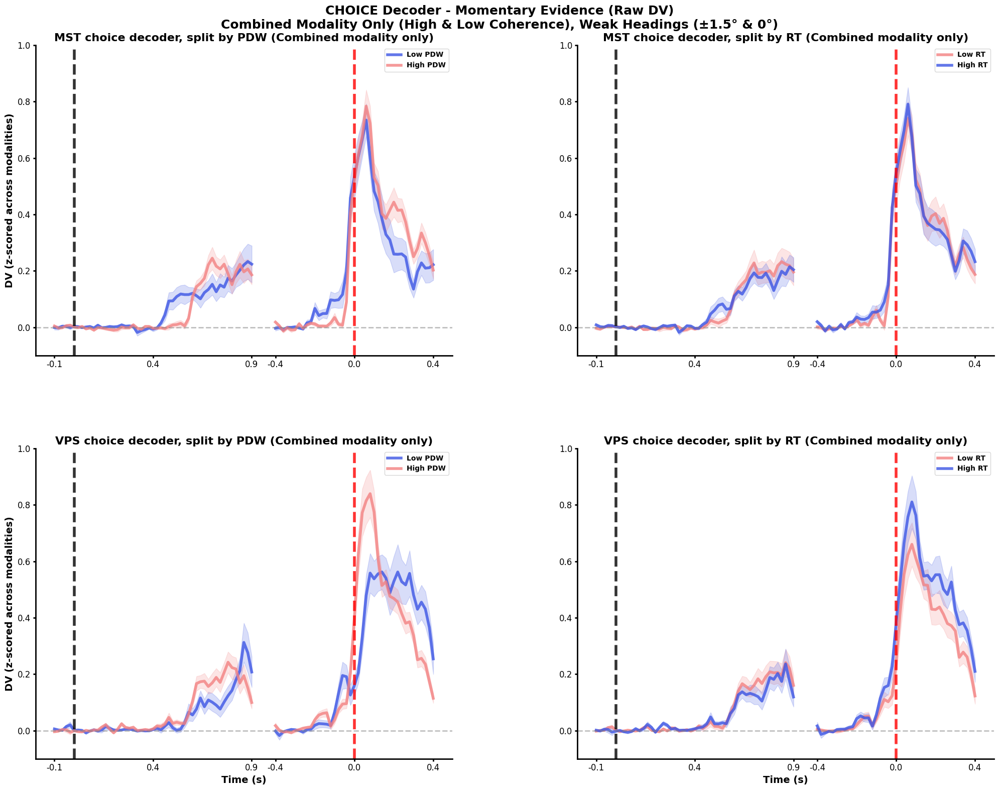


SUMMARY STATISTICS - CHOICE DECODER - RAW

VPS Area:
  Total trials: 5704
  Z-score parameters (from all modalities):
    Mean: 0.0000
    Std: 1.0000
  Heading distribution:
    Heading 1.0 (-10°): 1012 samples
    Heading 2.0 (-3.9°): 460 samples
    Heading 3.0 (-1.5°): 552 samples
    Heading 4.0 (0°): 920 samples
    Heading 5.0 (+1.5°): 828 samples
    Heading 6.0 (+3.9°): 1012 samples
    Heading 7.0 (+10°): 920 samples
  PDW - Median: 0.75, Mean: 0.74, Std: 0.18
  PDW - Low: 2116 trials, High: 3588 trials
  RT - Mean: 0.686s, Std: 0.072s
  RT - Median: 0.678s
  RT - Low: 2852 trials, High: 2852 trials

  Coherence distribution (Combined modality only):
    Low coherence: 2760 samples
    High coherence: 2944 samples

MST Area:
  Total trials: 5704
  Z-score parameters (from all modalities):
    Mean: 0.0000
    Std: 1.0000
  Heading distribution:
    Heading 1.0 (-10°): 1012 samples
    Heading 2.0 (-3.9°): 460 samples
    Heading 3.0 (-1.5°): 552 samples
    Heading 4.0 (0°):

In [ ]:
import numpy as np
from scipy import stats
from scipy.stats import f_oneway
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d

# Define ALL modality conditions for z-score calculation
all_modality_styles = [
    # {'name': 'Vestibular Low Coh', 'mod': 1, 'coh': 1, 'color': 'green', 'linestyle': '--'},
    # {'name': 'Vestibular High Coh', 'mod': 1, 'coh': 2, 'color': 'green', 'linestyle': '-'},
    # {'name': 'Visual Low Coh', 'mod': 2, 'coh': 1, 'color': 'purple', 'linestyle': '--'},
    # {'name': 'Visual High Coh', 'mod': 2, 'coh': 2, 'color': 'purple', 'linestyle': '-'},
    {'name': 'Combined Low Coh', 'mod': 3, 'coh': 1, 'color': 'blue', 'linestyle': '--'},
    {'name': 'Combined High Coh', 'mod': 3, 'coh': 2, 'color': 'blue', 'linestyle': '-'}
]


modality_styles = all_modality_styles

# Fixed parameters
areas = ['VPS', 'MST']
regression_method = 'decoders_noregress' # 'decoders_partialregress' or 'decoders_noregress'
selected_alignments = ['stimOn', 'saccOnset']
SELECTED_HEADINGS = [4]  # Use headings 3, 4, and 5 (±1.5° and 0°)

# Analysis options
SMOOTH_WINDOW = 5  # Smoothing window for slope calculation

# Define what to analyze
targets_to_analyze = ['choice']  # Analyze both

# Function to extract DV from decoder predictions using calculate_decision_variable
def extract_dv_from_decoder(trial):
    """Extract decision variable (DV) from decoder predictions using calculate_decision_variable"""
    if 'y_test' in trial and 'y_proba' in trial and trial['y_proba'] is not None:
        # Use the calculate_decision_variable function from cell 2
        y_test = trial['y_test']
        y_proba = trial['y_proba']
        dv = calculate_decision_variable(y_test, y_proba)
    elif 'y_pred_proba' in trial and 'y_pred' in trial:
        # Alternative field name
        dv = calculate_decision_variable(trial['y_pred'], trial['y_pred_proba'])
    elif 'decision_values' in trial:
        # If we have decision values directly
        dv = np.array(trial['decision_values'])
    else:
        # Fallback: use binary predictions
        dv = np.array(trial['y_pred']) * 2 - 1  # Convert 0/1 to -1/1
    
    # Ensure dv is always a numpy array
    if not isinstance(dv, np.ndarray):
        dv = np.array([dv]) if np.isscalar(dv) else np.array(dv)
    
    # Ensure dv is 1D
    if dv.ndim > 1:
        dv = dv.flatten()
    
    return dv

# Function to process DV based on analysis type
def process_dv(dv_values, analysis_type='raw'):
    """
    Process DV values based on analysis type
    
    Parameters:
    - dv_values: array of DV values
    - analysis_type: 'raw', 'slope', or 'accumulation'
    """
    if analysis_type == 'raw':
        # Return raw DV values (momentary evidence)
        return dv_values
    
    elif analysis_type == 'slope':
        # Calculate derivative (rate of change)
        # First, smooth the signal
        if len(dv_values) > SMOOTH_WINDOW:
            smoothed = gaussian_filter1d(dv_values, sigma=SMOOTH_WINDOW/4)
        else:
            smoothed = dv_values
        
        # Calculate derivative
        if len(smoothed) > 1:
            slopes = np.gradient(smoothed)
        else:
            slopes = np.zeros_like(smoothed)
        
        return slopes
    
    elif analysis_type == 'accumulation':
        # For accumulation, we'll handle this differently in the main loop
        # Just return raw values here
        return dv_values
    
    else:
        raise ValueError(f"Unknown analysis type: {analysis_type}")

# Define RT and PDW categorization functions
def categorize_rt(rt_values):
    """Categorize RT into two groups based on median split"""
    valid_rt = rt_values[~np.isnan(rt_values)]
    if len(valid_rt) == 0:
        return np.full_like(rt_values, np.nan)
    
    median_rt = np.median(valid_rt)
    
    rt_category = np.full_like(rt_values, np.nan)
    rt_category[rt_values < median_rt] = 0  # Low RT
    rt_category[rt_values >= median_rt] = 1  # High RT
    
    return rt_category

def categorize_pdw(pdw_values):
    """Categorize PDW into high/low based on median split"""
    valid_pdw = pdw_values[~np.isnan(pdw_values)]
    if len(valid_pdw) == 0:
        return np.full_like(pdw_values, np.nan)
    
    median_pdw = np.median(valid_pdw)
    pdw_category = np.full_like(pdw_values, np.nan)
    pdw_category[pdw_values < median_pdw] = 0  # Low PDW
    pdw_category[pdw_values >= median_pdw] = 1  # High PDW
    
    return pdw_category

# Run all three analysis types
for DV_ANALYSIS_TYPE in ['raw']: #for DV_ANALYSIS_TYPE in ['raw', 'slope', 'accumulation']:
    print(f"\n{'#'*80}")
    print(f"RUNNING ANALYSIS TYPE: {DV_ANALYSIS_TYPE.upper()}")
    print(f"{'#'*80}")
    
    # Loop through each target (choice and stimulus)
    for target in targets_to_analyze:
        print(f"\n{'='*80}")
        print(f"ANALYZING {target.upper()} DECODER - {DV_ANALYSIS_TYPE.upper()}")
        print(f"{'='*80}")
        
        # Create figure with 4 subplots
        fig, axes = plt.subplots(2, 2, figsize=(20, 16))
        
        # Get time axes for both alignments
        stimon_time_axis = time_axes_dots3DMP['stimOn']
        saccade_time_axis = time_axes_dots3DMP['saccOnset']
        
        # For saccOnset, only use from -400ms to end
        saccade_start_idx = np.where(saccade_time_axis >= -0.4)[0][0]
        saccade_time_axis_trimmed = saccade_time_axis[saccade_start_idx:]
        
        # Create combined x-axis positions (indices) and labels
        stimon_indices = np.arange(len(stimon_time_axis))
        gap_size = 5
        saccade_indices = np.arange(len(saccade_time_axis_trimmed)) + len(stimon_time_axis) + gap_size
        
        combined_indices = np.concatenate([stimon_indices, saccade_indices])
        combined_time_labels = np.concatenate([stimon_time_axis, saccade_time_axis_trimmed])
        
        # First, collect ALL modality data for z-score calculation (only needed for 'slope' and 'accumulation')
        all_modality_data = {area: [] for area in areas}
        
        if DV_ANALYSIS_TYPE != 'raw':  # Skip z-score calculation for raw analysis
            for area in areas:
                print(f"\nCollecting ALL modality data for {area} to compute z-scores...")
                
                # Collect data from ALL modalities
                for mod_config in all_modality_styles:
                    mod = mod_config['mod']
                    coh = mod_config['coh']
                    
                    for alignment in selected_alignments:
                        all_trials = []
                        for date in dates:
                            filepath = get_filepath(date, area, alignment, target, mod, coh, regression=regression_method)
                            try:
                                results = np.load(filepath, allow_pickle=True).item()
                                all_trials.extend(results['trial_results'])
                            except:
                                continue
                        
                        # Process trials
                        for trial in all_trials:
                            if 'y_test' in trial and 'y_pred' in trial:
                                # Extract DV
                                dv = extract_dv_from_decoder(trial)
                                
                                # Get behavioral data if available
                                if 'test_behavior' in trial:
                                    behavior = trial['test_behavior']
                                    
                                    # Extract heading indices
                                    heading_ind = behavior.get('headingInd', [])
                                    
                                    # FILTER FOR SELECTED HEADINGS ONLY
                                    if hasattr(heading_ind, '__len__'):
                                        if not any(h in heading_ind for h in SELECTED_HEADINGS):
                                            continue
                                    else:
                                        if heading_ind not in SELECTED_HEADINGS:
                                            continue
                                    
                                    # Store all DV values for z-score calculation
                                    all_modality_data[area].extend(dv)
        
        # Compute z-score parameters across all modalities (only for non-raw analysis)
        z_score_params = {}
        for area in areas:
            if DV_ANALYSIS_TYPE != 'raw' and all_modality_data[area]:
                z_score_params[area] = {
                    'mean': np.mean(all_modality_data[area]),
                    'std': np.std(all_modality_data[area])
                }
                print(f"\n{area} z-score params - Mean: {z_score_params[area]['mean']:.4f}, Std: {z_score_params[area]['std']:.4f}")
            else:
                z_score_params[area] = {'mean': 0, 'std': 1}
        
        # Now collect data ONLY from Combined modality for analysis
        all_data = {area: {} for area in areas}
        
        for area in areas:
            print(f"\nCollecting {target} decoder data for {area} (Combined modality only)...")
            
            # Initialize storage
            all_data[area] = {
                'dv': [],
                'pdw': [],
                'rt': [],
                'modality': [],
                'coherence': [],
                'heading': [],
                'time_indices': [],
                'alignment': []
            }
            
            # Collect data ONLY from Combined modality
            for mod_config in modality_styles:
                mod = mod_config['mod']
                coh = mod_config['coh']
                
                for alignment in selected_alignments:
                    all_trials = []
                    for date in dates:
                        filepath = get_filepath(date, area, alignment, target, mod, coh, regression=regression_method)
                        try:
                            results = np.load(filepath, allow_pickle=True).item()
                            all_trials.extend(results['trial_results'])
                        except:
                            continue
                    
                    # Process trials
                    for trial in all_trials:
                        if 'y_test' in trial and 'y_pred' in trial:
                            # Extract DV
                            dv = extract_dv_from_decoder(trial) #check point
                            
                            # Get behavioral data if available
                            if 'test_behavior' in trial:
                                behavior = trial['test_behavior']
                                
                                # Extract heading indices
                                heading_ind = behavior.get('headingInd', [])
                                
                                # FILTER FOR SELECTED HEADINGS ONLY
                                if hasattr(heading_ind, '__len__'):
                                    if not any(h in heading_ind for h in SELECTED_HEADINGS):
                                        continue
                                else:
                                    if heading_ind not in SELECTED_HEADINGS:
                                        continue
                                
                                # Extract PDW and RT
                                pdw_values = behavior.get('PDW', np.nan)
                                if hasattr(pdw_values, '__len__'):
                                    pdw = np.mean(pdw_values) if len(pdw_values) > 0 else np.nan
                                else:
                                    pdw = pdw_values
                                
                                rt_values = behavior.get('RT', np.nan)
                                if hasattr(rt_values, '__len__'):
                                    rt = np.mean(rt_values) if len(rt_values) > 0 else np.nan
                                else:
                                    rt = rt_values
                                
                                # Store data
                                time_idx = trial['time']
                                if alignment == 'saccOnset':
                                    time_idx = time_idx - saccade_start_idx
                                
                                if 0 <= time_idx < (len(stimon_time_axis) if alignment == 'stimOn' else len(saccade_time_axis_trimmed)):
                                    # Ensure heading_ind is iterable
                                    if not hasattr(heading_ind, '__len__'):
                                        heading_ind = [heading_ind] * len(dv)
                                    elif len(heading_ind) == 1 and len(dv) > 1:
                                        # Single heading for entire trial
                                        heading_ind = [heading_ind[0]] * len(dv)
                                    
                                    # For each trial (each element in dv) - add ONE entry per trial only
                                    # Use only the first dv value to represent this trial
                                    if len(dv) > 0:
                                        dv_val = dv[0]  # Take first DV value
                                        heading_val = heading_ind[0] if len(heading_ind) > 0 else heading_ind
                                        
                                        all_data[area]['dv'].append(dv_val)
                                        all_data[area]['pdw'].append(pdw)
                                        all_data[area]['rt'].append(rt)
                                        all_data[area]['modality'].append(mod)
                                        all_data[area]['coherence'].append(coh)
                                        all_data[area]['heading'].append(heading_val)
                                        all_data[area]['time_indices'].append(time_idx)
                                        all_data[area]['alignment'].append(alignment)
        
        # Convert to numpy arrays
        for area in areas:
            for key in all_data[area]:
                all_data[area][key] = np.array(all_data[area][key])
        
        # Process data and create plots
        # Process data and create plots
        plot_configs = [
            {'row': 0, 'col': 0, 'area': 'MST', 'split_by': 'PDW', 'title': f'MST {target} decoder, split by PDW (Combined modality only)'},
            {'row': 0, 'col': 1, 'area': 'MST', 'split_by': 'RT', 'title': f'MST {target} decoder, split by RT (Combined modality only)'},
            {'row': 1, 'col': 0, 'area': 'VPS', 'split_by': 'PDW', 'title': f'VPS {target} decoder, split by PDW (Combined modality only)'},
            {'row': 1, 'col': 1, 'area': 'VPS', 'split_by': 'RT', 'title': f'VPS {target} decoder, split by RT (Combined modality only)'}
        ]
        
        # Define colors for splits
        # PDW-only split: simple colors
        rt_colors = {0: '#F38181', 1: '#3C55E4'}  # Low RT: Blue, High RT: Orange
        pdw_colors = {0: '#3C55E4', 1: '#F38181'}  # Low: blue, High: red
        
        for config in plot_configs:
            ax = axes[config['row'], config['col']]
            area = config['area']
            split_by = config['split_by']
            
            print(f"\nProcessing {config['title']}...")
            
            # Get data for this area
            area_data = all_data[area]
            
            # Handle DV based on analysis type
            if DV_ANALYSIS_TYPE == 'raw':
                # For raw analysis, use unmodified DV values # check point
                normalized_dv = area_data['dv']
            else:
                # For other analysis types, apply z-score normalization using parameters from ALL modalities
                z_mean = z_score_params[area]['mean']
                z_std = z_score_params[area]['std']
                
                if z_std > 0:
                    normalized_dv = (area_data['dv'] - z_mean) / z_std
                else:
                    normalized_dv = area_data['dv'] - z_mean
            
            # Categorize split variable
            if split_by == 'PDW':
                split_categories = categorize_pdw(area_data['pdw'])
                split_labels = ['Low PDW', 'High PDW']
                split_colors = pdw_colors
            else:  # RT
                split_categories = categorize_rt(area_data['rt'])
                split_labels = ['Low RT', 'High RT']
                split_colors = rt_colors
            
            # Special handling for accumulation
            if DV_ANALYSIS_TYPE == 'accumulation':
                # For accumulation, use z-scored DV values
                for cat_idx, cat_label in enumerate(split_labels):
                    
                    cat_mask = (split_categories == cat_idx) & ~np.isnan(normalized_dv)
                    
                    if np.sum(cat_mask) == 0:
                        continue
                    
                    # For stimOn alignment
                    stimon_values_by_time = {t: [] for t in range(len(stimon_time_axis))}
                    stimon_mask = (area_data['alignment'] == 'stimOn') & cat_mask
                    
                    for i in np.where(stimon_mask)[0]:
                        t_idx = area_data['time_indices'][i]
                        if 0 <= t_idx < len(stimon_time_axis):
                            stimon_values_by_time[t_idx].append(normalized_dv[i])
                    
                    # Calculate mean at each time point
                    stimon_mean_by_time = []
                    for t in range(len(stimon_time_axis)):
                        if stimon_values_by_time[t]:
                            stimon_mean_by_time.append(np.mean(stimon_values_by_time[t]))
                        else:
                            stimon_mean_by_time.append(0)
                    
                    # Find stimulus onset for baseline correction
                    stim_onset_idx = np.where(stimon_time_axis >= 0)[0][0]
                    
                    # Accumulate with baseline correction
                    stimon_times = []
                    stimon_accumulated = []
                    stimon_sems = []
                    cumulative_sum = 0
                    
                    # Calculate baseline (pre-stimulus mean)
                    baseline = np.mean(stimon_mean_by_time[:stim_onset_idx]) if stim_onset_idx > 0 else 0
                    
                    for t in range(len(stimon_time_axis)):
                        # Subtract baseline before accumulating
                        cumulative_sum += (stimon_mean_by_time[t] - baseline)
                        stimon_times.append(stimon_indices[t])
                        stimon_accumulated.append(cumulative_sum)
                        
                        if stimon_values_by_time[t]:
                            stimon_sems.append(stats.sem(stimon_values_by_time[t]))
                        else:
                            stimon_sems.append(0)
                    
                    # For saccade alignment
                    saccade_values_by_time = {t: [] for t in range(len(saccade_time_axis_trimmed))}
                    saccade_mask = (area_data['alignment'] == 'saccOnset') & cat_mask
                    
                    for i in np.where(saccade_mask)[0]:
                        t_idx = area_data['time_indices'][i]
                        if 0 <= t_idx < len(saccade_time_axis_trimmed):
                            saccade_values_by_time[t_idx].append(normalized_dv[i])
                    
                    # Calculate mean at each time point
                    saccade_mean_by_time = []
                    for t in range(len(saccade_time_axis_trimmed)):
                        if saccade_values_by_time[t]:
                            saccade_mean_by_time.append(np.mean(saccade_values_by_time[t]))
                        else:
                            saccade_mean_by_time.append(0)
                    
                    # Accumulate
                    saccade_times = []
                    saccade_accumulated = []
                    saccade_sems = []
                    cumulative_sum = 0
                    
                    for t in range(len(saccade_time_axis_trimmed)):
                        cumulative_sum += saccade_mean_by_time[t]
                        saccade_times.append(saccade_indices[t])
                        saccade_accumulated.append(cumulative_sum)
                        
                        if saccade_values_by_time[t]:
                            saccade_sems.append(stats.sem(saccade_values_by_time[t]))
                        else:
                            saccade_sems.append(0)
                    
                    # Plot
                    label = cat_label
                    color = split_colors[cat_idx]
                    
                    if stimon_times:
                        ax.plot(stimon_times, stimon_accumulated, 
                               color=color, linewidth=4, 
                               label=label, alpha=0.8)
                        # Simple error bands (not cumulative)
                        upper_bound = np.array(stimon_accumulated) + np.array(stimon_sems) * 2
                        lower_bound = np.array(stimon_accumulated) - np.array(stimon_sems) * 2
                        ax.fill_between(stimon_times, lower_bound, upper_bound,
                                       color=color, alpha=0.2)
                    
                    if saccade_times:
                        ax.plot(saccade_times, saccade_accumulated, 
                               color=color, linewidth=4, alpha=0.8)
                        upper_bound = np.array(saccade_accumulated) + np.array(saccade_sems) * 2
                        lower_bound = np.array(saccade_accumulated) - np.array(saccade_sems) * 2
                        ax.fill_between(saccade_times, lower_bound, upper_bound,
                                       color=color, alpha=0.2)
            
            else:  # For 'raw' and 'slope' analysis
                # Process DV based on analysis type (using z-scored values)
                processed_dv = process_dv(normalized_dv, DV_ANALYSIS_TYPE)
                
                # Now pool all data together for each split category
                for cat_idx, cat_label in enumerate(split_labels):
                    
                    # Get all data for this category
                    cat_mask = (split_categories == cat_idx) & ~np.isnan(processed_dv)
                    
                    if np.sum(cat_mask) == 0:
                        continue
                    
                    # Organize by time
                    stimon_pooled = {t: [] for t in range(len(stimon_time_axis))}
                    saccade_pooled = {t: [] for t in range(len(saccade_time_axis_trimmed))}
                    
                    # Pool all data for this category
                    cat_neural = processed_dv[cat_mask]
                    cat_time_indices = area_data['time_indices'][cat_mask]
                    cat_alignment = area_data['alignment'][cat_mask]
                    
                    for i, t_idx in enumerate(cat_time_indices):
                        if cat_alignment[i] == 'stimOn' and t_idx < len(stimon_time_axis):
                            stimon_pooled[t_idx].append(cat_neural[i])
                        elif cat_alignment[i] == 'saccOnset' and t_idx < len(saccade_time_axis_trimmed):
                            saccade_pooled[t_idx].append(cat_neural[i])
                    
                    # Calculate means and SEMs
                    stimon_times = []
                    stimon_means = []
                    stimon_sems = []
                    
                    for t in range(len(stimon_time_axis)):
                        if stimon_pooled[t]:
                            stimon_times.append(stimon_indices[t])
                            stimon_means.append(np.mean(stimon_pooled[t]))
                            stimon_sems.append(stats.sem(stimon_pooled[t]))
                    
                    saccade_times = []
                    saccade_means = []
                    saccade_sems = []
                    
                    for t in range(len(saccade_time_axis_trimmed)):
                        if saccade_pooled[t]:
                            saccade_times.append(saccade_indices[t])
                            saccade_means.append(np.mean(saccade_pooled[t]))
                            saccade_sems.append(stats.sem(saccade_pooled[t]))
                    
                    # Plot - single line per category
                    label = cat_label
                    color = split_colors[cat_idx]
                    
                    if stimon_times:
                        ax.plot(stimon_times, stimon_means, 
                               color=color, linewidth=4, 
                               label=label, alpha=0.8)
                        ax.fill_between(stimon_times,
                                       np.array(stimon_means) - np.array(stimon_sems),
                                       np.array(stimon_means) + np.array(stimon_sems),
                                       color=color, alpha=0.2)
                    
                    if saccade_times:
                        ax.plot(saccade_times, saccade_means, 
                               color=color, linewidth=4, alpha=0.8)
                        ax.fill_between(saccade_times,
                                       np.array(saccade_means) - np.array(saccade_sems),
                                       np.array(saccade_means) + np.array(saccade_sems),
                                       color=color, alpha=0.2)
            
            # Format subplot
            # Remove top and right spines
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            
            # Add reference line at 0
            ax.axhline(y=0, color='gray', linestyle='--', alpha=0.5, linewidth=2)
            
            # Add event alignment markers
            stimon_zero_idx = np.where(stimon_time_axis >= 0)[0][0]
            saccade_zero_idx = saccade_indices[0] + np.where(saccade_time_axis_trimmed >= 0)[0][0]
            
            ax.axvline(x=stimon_zero_idx, color='black', linestyle='--', alpha=0.8, linewidth=4)
            ax.axvline(x=saccade_zero_idx, color='red', linestyle='--', alpha=0.8, linewidth=4)
            
            # Set custom x-axis ticks and labels
            stimon_ticks = [0, len(stimon_time_axis)//2, len(stimon_time_axis)-1]
            saccade_ticks = [saccade_indices[0], 
                            saccade_indices[len(saccade_indices)//2], 
                            saccade_indices[-1]]

            tick_indices = stimon_ticks + saccade_ticks

            stimon_tick_labels = [f'{stimon_time_axis[t]:.1f}' for t in stimon_ticks]
            saccade_tick_labels = [f'{saccade_time_axis_trimmed[0]:.1f}',
                                f'{saccade_time_axis_trimmed[len(saccade_time_axis_trimmed)//2]:.1f}',
                                f'{saccade_time_axis_trimmed[-1]:.1f}']

            tick_labels = stimon_tick_labels + saccade_tick_labels

            ax.set_xticks(tick_indices)
            ax.set_xticklabels(tick_labels)
            
            # Set labels
            if config['row'] == 1:  # Bottom row
                ax.set_xlabel('Time (s)', fontsize=14, fontweight='bold')
            
            if config['col'] == 0:  # Left column
                if DV_ANALYSIS_TYPE == 'raw':
                    ylabel = 'DV (z-scored across modalities)'
                elif DV_ANALYSIS_TYPE == 'slope':
                    ylabel = 'DV Rate of Change (z-scored)'
                else:  # accumulation
                    ylabel = 'Accumulated DV (z-scored)'
                ax.set_ylabel(ylabel, fontsize=14, fontweight='bold')
            
            # Set title
            ax.set_title(config['title'], fontsize=16, fontweight='bold')
            
            # Set y-limits based on analysis type (adjusted for z-scored data)
            if DV_ANALYSIS_TYPE == 'raw':
                ax.set_ylim(-0.1, 1)  # Z-scored range
            elif DV_ANALYSIS_TYPE == 'slope':
                ax.set_ylim(-0.5, 0.5)  # Smaller range for derivatives
            else:  # accumulation
                ax.set_ylim(-10, 10)  # Larger range

            # Add legend
            ax.legend(fontsize=12, prop={'weight': 'bold'}, loc='upper right')
            
            # Make remaining spines thicker
            ax.spines['left'].set_linewidth(2)
            ax.spines['bottom'].set_linewidth(2)
            ax.tick_params(width=2, labelsize=12)
        
        # Add overall title based on analysis type
        if DV_ANALYSIS_TYPE == 'raw':
            analysis_desc = 'Momentary Evidence (Raw DV)'
        elif DV_ANALYSIS_TYPE == 'slope':
            analysis_desc = 'Rate of Evidence Change (DV Slope)'
        else:  # accumulation
            analysis_desc = 'Accumulated Evidence (DV Integration)'
        
        fig.suptitle(f'{target.upper()} Decoder - {analysis_desc}\nCombined Modality Only (High & Low Coherence), Weak Headings (±1.5° & 0°)', 
                     fontsize=18, fontweight='bold', y=0.98)
        
        plt.tight_layout()
        plt.subplots_adjust(top=0.93, hspace=0.3, wspace=0.3)
        
        # Save figure
        save_filename = f"D:\\Neural-Pipeline\\results\\analysis_population\\{target}_decoder_{DV_ANALYSIS_TYPE}_combined_only_weak_headings_RT_PDW_zscore.png"
        plt.savefig(save_filename, dpi=300, bbox_inches='tight')
        print(f"\nFigure saved as: {save_filename}")
        
        plt.show()
        
        # Print summary statistics
        print(f"\n{'='*60}")
        print(f"SUMMARY STATISTICS - {target.upper()} DECODER - {DV_ANALYSIS_TYPE.upper()}")
        print(f"{'='*60}")
        
        for area in areas:
            print(f"\n{area} Area:")
            area_data = all_data[area]
            
            # Total trials
            print(f"  Total trials: {len(area_data['dv'])}")
            
            # Z-score statistics
            print(f"  Z-score parameters (from all modalities):")
            print(f"    Mean: {z_score_params[area]['mean']:.4f}")
            print(f"    Std: {z_score_params[area]['std']:.4f}")
            
            # Heading distribution
            unique_headings, heading_counts = np.unique(area_data['heading'], return_counts=True)
            print(f"  Heading distribution:")
            heading_deg_map = {1: '-10°', 2: '-3.9°', 3: '-1.5°', 4: '0°', 5: '+1.5°', 6: '+3.9°', 7: '+10°'}
            for h, c in zip(unique_headings, heading_counts):
                heading_label = heading_deg_map.get(h, f'Heading {h}')
                print(f"    Heading {h} ({heading_label}): {c} samples")
            
            # PDW statistics
            valid_pdw = area_data['pdw'][~np.isnan(area_data['pdw'])]
            if len(valid_pdw) > 0:
                print(f"  PDW - Median: {np.median(valid_pdw):.2f}, Mean: {np.mean(valid_pdw):.2f}, Std: {np.std(valid_pdw):.2f}")
                pdw_cats = categorize_pdw(area_data['pdw'])
                print(f"  PDW - Low: {np.sum(pdw_cats == 0)} trials, High: {np.sum(pdw_cats == 1)} trials")
            
            # RT statistics
            valid_rt = area_data['rt'][~np.isnan(area_data['rt'])]
            if len(valid_rt) > 0:
                print(f"  RT - Mean: {np.mean(valid_rt):.3f}s, Std: {np.std(valid_rt):.3f}s")
                print(f"  RT - Median: {np.median(valid_rt):.3f}s")
                rt_cats = categorize_rt(area_data['rt'])
                print(f"  RT - Low: {np.sum(rt_cats == 0)} trials, High: {np.sum(rt_cats == 1)} trials")
            
            # Coherence distribution
            print(f"\n  Coherence distribution (Combined modality only):")
            unique_cohs, coh_counts = np.unique(area_data['coherence'], return_counts=True)
            for coh, count in zip(unique_cohs, coh_counts):
                coh_name = 'Low' if coh == 1 else 'High'
                print(f"    {coh_name} coherence: {count} samples")




################################################################################
COMBINED CORRECTNESS + PDW ANALYSIS WITH RAW DV
################################################################################




Processing VPS decoder

  stimOn:
    Incorrect, Low PDW: 969 trials
    Incorrect, High PDW: 2040 trials
    Correct, Low PDW: 306 trials
    Correct, High PDW: 765 trials

  saccOnset:
    Incorrect, Low PDW: 779 trials
    Incorrect, High PDW: 1640 trials
    Correct, Low PDW: 246 trials
    Correct, High PDW: 615 trials

Processing MST decoder

  stimOn:
    Incorrect, Low PDW: 969 trials
    Incorrect, High PDW: 2040 trials
    Correct, Low PDW: 306 trials
    Correct, High PDW: 765 trials

  saccOnset:
    Incorrect, Low PDW: 779 trials
    Incorrect, High PDW: 1640 trials
    Correct, Low PDW: 246 trials
    Correct, High PDW: 615 trials


Figure saved as: D:\Neural-Pipeline\results\analysis_population\Combined_Correctness_PDW_comparison_raw_DV.png


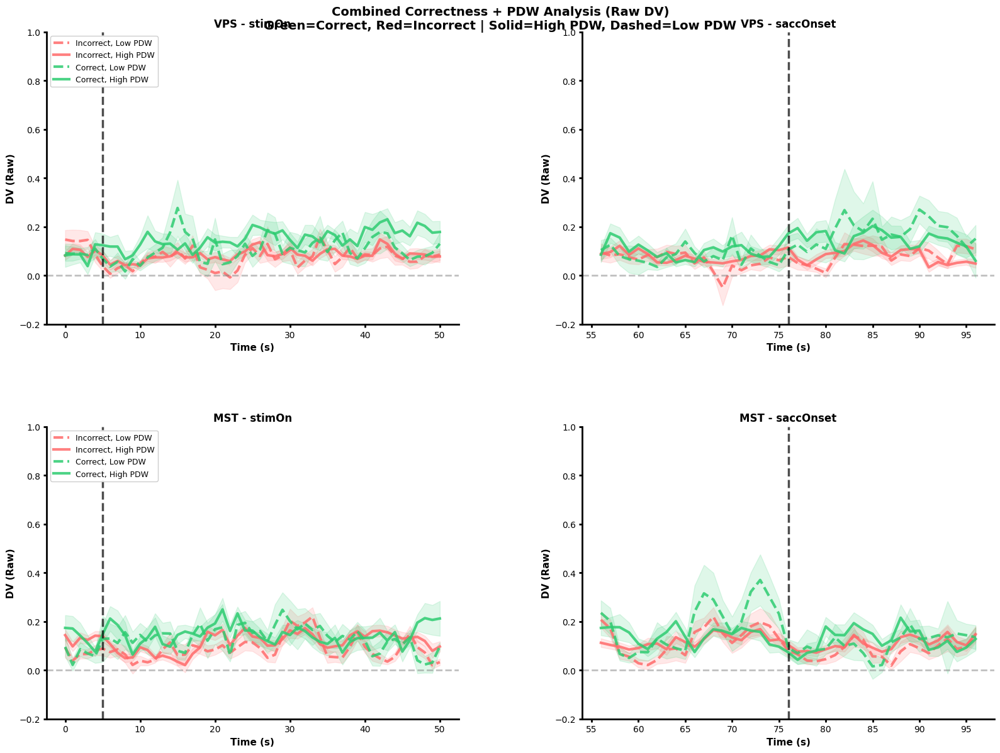


COMBINED CORRECTNESS + PDW VISUALIZATION COMPLETE!


In [38]:
# Combined Correctness + PDW Analysis - Plotting with 4 lines per subplot
# Color: Green = Correct, Red = Incorrect
# Line Style: Solid = High PDW, Dashed = Low PDW
# Layout: 2 rows (one per brain area), 2 columns (stimOn and saccOnset alignments)

print(f"\n{'#'*80}")
print(f"COMBINED CORRECTNESS + PDW ANALYSIS WITH RAW DV")
print(f"{'#'*80}\n")

# Create figure with 2 rows (one per brain area), 2 columns (stimOn and saccOnset)
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Define color and line style combinations
# (Correctness, PDW_category, color, linestyle, label)
combinations = [
    (0, 0, '#FF6B6B', '--', 'Incorrect, Low PDW'),    # Red dashed
    (0, 1, '#FF6B6B', '-', 'Incorrect, High PDW'),    # Red solid
    (1, 0, '#2ECC71', '--', 'Correct, Low PDW'),      # Green dashed
    (1, 1, '#2ECC71', '-', 'Correct, High PDW'),      # Green solid
]

# Collect correctness and other data for each brain area
all_correctness_data = {area: {} for area in areas}
targets_to_analyze = [ 'stimulus']  # Focus on choice decoder for this analysis
SELECTED_HEADINGS = [1,2,3,4,5,6,7]  # Focus on weak headings (-1.5°, 0°, +1.5°)
regression_method = 'decoders_partialregress'
for area in areas:
    print(f"\nCollecting {targets_to_analyze[0]} decoder data for {area} (including correctness)...")
    
    # Initialize storage
    all_correctness_data[area] = {
        'dv': [],
        'pdw': [],
        'correct': [],
        'time_indices': [],
        'alignment': []
    }
    
    # Collect data ONLY from Combined modality
    for mod_config in modality_styles:
        mod = mod_config['mod']
        coh = mod_config['coh']
        
        for alignment in selected_alignments:
            all_trials = []
            for date in dates:
                filepath = get_filepath(date, area, alignment, targets_to_analyze[0], mod, coh, regression=regression_method)
                try:
                    results = np.load(filepath, allow_pickle=True).item()
                    all_trials.extend(results['trial_results'])
                except:
                    continue
            
            # Process trials
            for trial in all_trials:
                if 'y_test' in trial and 'y_pred' in trial:
                    # Extract DV
                    dv = extract_dv_from_decoder(trial)
                    
                    # Get behavioral data if available
                    if 'test_behavior' in trial:
                        behavior = trial['test_behavior']
                        
                        # Extract heading indices
                        heading_ind = behavior.get('headingInd', [])
                        
                        # FILTER FOR SELECTED HEADINGS ONLY
                        if hasattr(heading_ind, '__len__'):
                            if not any(h in heading_ind for h in SELECTED_HEADINGS):
                                continue
                        else:
                            if heading_ind not in SELECTED_HEADINGS:
                                continue
                        
                        # Extract PDW
                        pdw_values = behavior.get('PDW', np.nan)
                        if hasattr(pdw_values, '__len__'):
                            pdw = np.mean(pdw_values) if len(pdw_values) > 0 else np.nan
                        else:
                            pdw = pdw_values
                        
                        # Extract Correctness
                        correct_values = behavior.get('correct', np.nan)
                        if hasattr(correct_values, '__len__'):
                            correct = np.mean(correct_values) if len(correct_values) > 0 else np.nan
                        else:
                            correct = correct_values
                        
                        # Store data
                        time_idx = trial['time']
                        if alignment == 'saccOnset':
                            time_idx = time_idx - saccade_start_idx
                        
                        if 0 <= time_idx < (len(stimon_time_axis) if alignment == 'stimOn' else len(saccade_time_axis_trimmed)):
                            # For each trial (each element in dv)
                            for i, dv_val in enumerate(dv):
                                all_correctness_data[area]['dv'].append(dv_val)
                                all_correctness_data[area]['pdw'].append(pdw)
                                all_correctness_data[area]['correct'].append(correct)
                                all_correctness_data[area]['time_indices'].append(time_idx)
                                all_correctness_data[area]['alignment'].append(alignment)
    
    # Convert to numpy arrays
    for key in all_correctness_data[area]:
        all_correctness_data[area][key] = np.array(all_correctness_data[area][key])

# Plot for each alignment and brain area
for area_idx, area in enumerate(areas):
    print(f"\n{'='*60}")
    print(f"Processing {area} decoder")
    print(f"{'='*60}")
    
    area_data = all_correctness_data[area]
    
    # Use raw DV values (no z-scoring)
    raw_dv = area_data['dv']
    
    # Categorize Correctness and PDW
    correctness_cats = area_data['correct'].astype(int)  # 0=Incorrect, 1=Correct
    pdw_cats = categorize_pdw(area_data['pdw'])
    
    # Plot for each alignment
    for align_idx, alignment in enumerate(selected_alignments):
        ax = axes[area_idx, align_idx]
        
        print(f"\n  {alignment}:")
        
        # Get alignment-specific time axis
        if alignment == 'stimOn':
            time_axis = stimon_time_axis
            time_indices = stimon_indices
        else:  # saccOnset
            time_axis = saccade_time_axis_trimmed
            time_indices = saccade_indices
        
        # Plot each combination
        for corr_val, pdw_val, color, linestyle, label in combinations:
            # Get mask for this combination, filtering by alignment
            mask = (correctness_cats == corr_val) & (pdw_cats == pdw_val) & \
                   (area_data['alignment'] == alignment) & \
                   ~np.isnan(raw_dv)
            
            if np.sum(mask) == 0:
                print(f"    {label}: 0 trials")
                continue
            
            # Extract data for this combination
            cat_neural = raw_dv[mask]
            cat_time_indices = area_data['time_indices'][mask].astype(int)
            
            # Pool data by time bin
            pooled_data = {t: [] for t in range(len(time_axis))}
            
            for i, t_idx in enumerate(cat_time_indices):
                if 0 <= t_idx < len(time_axis):
                    pooled_data[t_idx].append(cat_neural[i])
            
            # Calculate means and SEMs
            plot_times = []
            plot_means = []
            plot_sems = []
            
            for t in range(len(time_axis)):
                if pooled_data[t]:
                    plot_times.append(time_indices[t])
                    plot_means.append(np.mean(pooled_data[t]))
                    plot_sems.append(stats.sem(pooled_data[t]))
            
            trial_count = np.sum(mask)
            print(f"    {label}: {trial_count} trials")
            
            # Plot
            if plot_times:
                ax.plot(plot_times, plot_means, 
                       color=color, linewidth=3, linestyle=linestyle,
                       label=label, alpha=0.85)
                ax.fill_between(plot_times,
                               np.array(plot_means) - np.array(plot_sems),
                               np.array(plot_means) + np.array(plot_sems),
                               color=color, alpha=0.15)
        
        # Format subplot
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['left'].set_linewidth(2)
        ax.spines['bottom'].set_linewidth(2)
        
        # Add reference line at 0
        ax.axhline(y=0, color='gray', linestyle='--', alpha=0.5, linewidth=2)
        
        # Add event alignment marker at time 0
        zero_idx = np.where(time_axis >= 0)[0]
        if len(zero_idx) > 0:
            zero_pos = time_indices[zero_idx[0]]
            ax.axvline(x=zero_pos, color='black', linestyle='--', alpha=0.7, linewidth=2.5)
        
        # Set labels and title
        ax.set_xlabel('Time (s)', fontsize=11, fontweight='bold')
        ax.set_ylabel('DV (Raw)', fontsize=11, fontweight='bold')
        ax.set_title(f'{area} - {alignment}', fontsize=12, fontweight='bold')
        ax.tick_params(width=2, labelsize=10)
        
        # Set y-limits
        ax.set_ylim(-0.2, 1)
        
        # Add legend only to first column
        if align_idx == 0:
            ax.legend(fontsize=9, loc='upper left', framealpha=0.95)

# Add overall title
fig.suptitle('Combined Correctness + PDW Analysis (Raw DV)\nGreen=Correct, Red=Incorrect | Solid=High PDW, Dashed=Low PDW', 
             fontsize=14, fontweight='bold', y=0.995)

plt.tight_layout()
plt.subplots_adjust(top=0.96, hspace=0.35, wspace=0.3)

# Save figure
save_filename = f"D:\\Neural-Pipeline\\results\\analysis_population\\Combined_Correctness_PDW_comparison_raw_DV.png"
plt.savefig(save_filename, dpi=300, bbox_inches='tight')
print(f"\n\nFigure saved as: {save_filename}")

plt.show()

print("\n" + "="*80)
print("COMBINED CORRECTNESS + PDW VISUALIZATION COMPLETE!")
print("="*80)